# Notebook for analysing all VR trials in one experiment folder

## (assumes use of FlyOver version 9.3 or higher)


In [1]:
import numpy as np
import pandas as pd
    
from os import listdir, mkdir, walk, getcwd
from os.path import isfile, sep
from sys import path, exit
from glob import glob

from scipy.ndimage.filters import gaussian_filter

import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import gridspec
import seaborn as sns

from Tkinter import Tk
from tkFileDialog import askdirectory, askopenfilename

# Set path to analysis code directory
codeDir = sep.join(getcwd().split(sep)[:-2])
path.insert(1, codeDir)

from flyVR.flyVRAnalysis.flyVR_oneTrialBasicAnalysis import singleVRTrialAnalysis

# import custom plotting functions
from plottingUtilities.basicPlotting import makeNestedPlotDirectory, myAxisTheme, _myAccentList
from plottingUtilities.objectInteractionPlots import radDistAngleCombiPlot, plotResidencyInMiniarena,\
            make4ValuePolCoordPlot, plotWalkingVelocityDistr
from plottingUtilities.plotsWithDataframe import plotVeloHeadingDistribution_flyVR_df, plotVeloHeadingDistribution2_flyVR_df,\
            oneDimResidencyWithVar_df, turnRatePerDistance

# import custom analysis functions
from trajectoryAnalysis.trajectoryDerivedParams import relationToObject, cartesian2polar
from trajectoryAnalysis.circularStatsOnTrajectories import circmeanvec

%matplotlib inline
sns.set_style('ticks')

In [2]:
# Choose files to analyse ..............................................................................................

baseDir = '/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/'

root = Tk()
# prevents root window from appearing
root.withdraw()
root.update()

# choose experiment folder
dataDir = askdirectory(initialdir=baseDir,
                       title='Select experiment directory (containing directories for multiple flies)') + sep
root.update()
root.destroy()
expDirs = sorted(walk(dataDir).next()[1])

analysisDir = sep.join(dataDir.split(sep)[:-2]) + sep + 'analysis' + sep

try:
    expDirs.remove('virtualWorld')
except:
    print('You selected an invalid data directory.\n' +
          'Expected folder structure of the selected path is some/path/to/experimentName/flyGender/rawData/')
    exit(1)

print('\n Analysing the following folders:\n')
print(expDirs)

rerunbasicanalysis = raw_input('Would you like to (re-)run the basic analysis on each file \n'
                               'instead of loading previously saved data? (y, n)\n')


 Analysing the following folders:

['WTBxpBDPGal4f01', 'WTBxpBDPGal4f02', 'WTBxpBDPGal4f03', 'WTBxpBDPGal4f04', 'WTBxpBDPGal4f05', 'WTBxpBDPGal4f06', 'WTBxpBDPGal4f07', 'WTBxpBDPGal4f08', 'WTBxpBDPGal4f09', 'WTBxpBDPGal4f10', 'WTBxpBDPGal4f11', 'WTBxpBDPGal4f12', 'WTBxpBDPGal4f13', 'WTBxpBDPGal4f14', 'WTBxpBDPGal4f15', 'WTBxpBDPGal4f16', 'WTBxpBDPGal4f17', 'WTBxpBDPGal4f18', 'WTBxpBDPGal4f19', 'WTBxpBDPGal4f20', 'WTBxpBDPGal4f21', 'WTBxpBDPGal4f22']
Would you like to (re-)run the basic analysis on each file 
instead of loading previously saved data? (y, n)
n


In [3]:
expDirs = expDirs[:]
#my_indices = [0,4,7,10,11,13,17,19] #[1,2,3,4,5,9,10,14,15,17,18]
#expDirs = [expDirs[i] for i in my_indices]
print(expDirs)

['WTBxpBDPGal4f01', 'WTBxpBDPGal4f02', 'WTBxpBDPGal4f03', 'WTBxpBDPGal4f04', 'WTBxpBDPGal4f05', 'WTBxpBDPGal4f06', 'WTBxpBDPGal4f07', 'WTBxpBDPGal4f08', 'WTBxpBDPGal4f09', 'WTBxpBDPGal4f10', 'WTBxpBDPGal4f11', 'WTBxpBDPGal4f12', 'WTBxpBDPGal4f13', 'WTBxpBDPGal4f14', 'WTBxpBDPGal4f15', 'WTBxpBDPGal4f16', 'WTBxpBDPGal4f17', 'WTBxpBDPGal4f18', 'WTBxpBDPGal4f19', 'WTBxpBDPGal4f20', 'WTBxpBDPGal4f21', 'WTBxpBDPGal4f22']


### Compose mutli-fly data into dataframe

In [4]:
# generate fly color map
numFlies = len(expDirs)
cNorm  = colors.Normalize(vmin=0, vmax=numFlies)
flyCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='Accent')

In [5]:
expDir = dataDir + expDirs[0] + sep
FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]

In [6]:
keylist = ['curvature','gamma','gammaFull','headingAngle','objectDistance','rotVelo','time',
           'transVelo','xPos','xPosInMiniarena','yPos','yPosInMiniarena']

keylistLong = ['flyID','trial','trialtype','moving','walking'] + keylist
FOAllFlies_df = pd.DataFrame(data=np.zeros((0,len(keylistLong))), columns=keylistLong)

In [7]:
nTrialsVI = 0
nTrialsIN = 0
 
vTransTH = 2 #mm/s

# Go through directories of experiments with different flies ...............................................
for currExpDir in expDirs:

    expDir = dataDir + currExpDir + sep
    print('\n Analysing the following folder:\n')
    print(expDir)

    FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]
    FODataFiles = sorted(FODataFiles)

    print('\n Analysing the following log files:\n')
    print(FODataFiles)

    # Run single trial analysis on each file in folder .....................................................
    for fileToAnalyse in FODataFiles:

        flyID = fileToAnalyse.split('_')[0]#[-4]
        genotype = fileToAnalyse.split('_')[0][:-3]#[-5]
        trial = FODataFiles.index(fileToAnalyse) + 1
        
        if rerunbasicanalysis == 'y':
            returnVal = singleVRTrialAnalysis(expDir + fileToAnalyse)
            print('Ran analysis, now loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
        else:
            print('Loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]

        # Split into visible object trials and invisible object trials
        if 'Invisible' in fileToAnalyse or 'invisible' in fileToAnalyse:
            trialtype = 'invisible'
            nTrialsIN += 1
        else:
            trialtype = 'visible'
            nTrialsVI += 1
        
        # test if moving
        vTrans = np.copy(FODatLoad['transVelo'])
        moving = vTrans >= vTransTH
        
        # test if in walking bout
        vTrans_filt = np.copy(vTrans)
        vTrans_filt[vTrans_filt>30.0] = 0
        vTrans_filt = gaussian_filter(vTrans_filt, sigma=3)

        # add to data frame
        FODatLoad_df = pd.DataFrame.from_dict(FODatLoad,orient='columns')
        FODatLoad_df.insert(0, 'flyID', flyID)
        FODatLoad_df.insert(1, 'trial', trial)
        FODatLoad_df.insert(2, 'trialtype', trialtype)
        FODatLoad_df.insert(3, 'moving', moving)
        
        FOAllFlies_df = FOAllFlies_df.append(FODatLoad_df)
        
        # TODO: Add selection criteria, e.g. to only include trials from flies that were 
        # walking >40% of time and did not have a strong turn bias.
        
        plt.close("all")
        


 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/highContrast/WTBxpBDPGal4/females/rawData/WTBxpBDPGal4f01/

 Analysing the following log files:

['WTBxpBDPGal4f01_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151106214528.txt', 'WTBxpBDPGal4f01_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151106215810.txt', 'WTBxpBDPGal4f01_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151106220812.txt', 'WTBxpBDPGal4f01_FlyOver093_singleObjectForest_1cm4cmInvisibleCone_12cmHex_large_out_151106213308.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.


/Users/haberkernh/anaconda3/envs/py2.7/lib/python2.7/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/highContrast/WTBxpBDPGal4/females/rawData/WTBxpBDPGal4f02/

 Analysing the following log files:

['WTBxpBDPGal4f02_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151109205306.txt', 'WTBxpBDPGal4f02_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151109210311.txt', 'WTBxpBDPGal4f02_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151109211323.txt', 'WTBxpBDPGal4f02_FlyOver093_singleObjectForest_1cm4cmInvisibleCone_12cmHex_large_out_151109212612.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/highContrast/WTBxpBDPGal4/females/rawData/WTBxpBDPGal4f03/

 Analysing the following log files:

['WTBxpBDPGal4f03_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_out_151

Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/highContrast/WTBxpBDPGal4/females/rawData/WTBxpBDPGal4f14/

 Analysing the following log files:

['WTBxpBDPGal4f14_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_6d_out_151123172105.txt', 'WTBxpBDPGal4f14_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_6d_out_151123173108.txt', 'WTBxpBDPGal4f14_FlyOver093_singleObjectForest_1cm4cmCone_12cmHex_large_6d_out_151123174111.txt', 'WTBxpBDPGal4f14_FlyOver093_singleObjectForest_1cm4cmInvisibleCone_12cmHex_large_6d_out_151123165033.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObj/highContrast/WTBxpBDPGal4/females/rawData/WTBxpBDPGal4f15/

 Analysing the following log files:

['WTBxpBDPGal4f1

In [8]:
FOAllFlies_df =FOAllFlies_df[keylistLong]

FOAllFlies_df['flyID'] = FOAllFlies_df['flyID'].astype('category')
FOAllFlies_df['trial'] = FOAllFlies_df['trial'].astype('category')
FOAllFlies_df['trialtype'] = FOAllFlies_df['trialtype'].astype('category')

FOAllFlies_df.head()

,flyID,trial,trialtype,moving,walking,curvature,gamma,gammaFull,headingAngle,objectDistance,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena
0,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,-0.000004,NaN,0.050578,0.000000,0.000000,60.6220,NaN,35.000000,NaN
1,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.050006,0.000000,60.6220,NaN,35.000000,NaN
2,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.100012,0.000000,60.6220,NaN,35.000000,NaN
3,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.150018,0.000000,60.6220,NaN,35.000000,NaN
4,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.200023,0.000000,60.6220,NaN,35.000000,NaN
5,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.250029,0.000000,60.6220,NaN,35.000000,NaN
6,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.300035,0.000000,60.6220,NaN,35.000000,NaN
7,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.350041,0.000000,60.6220,NaN,35.000000,NaN
8,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.050502,0.400047,0.470931,60.6220,NaN,35.000000,NaN
9,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.005051,NaN,0.000000,0.450053,0.000000,60.6051,NaN,35.016400,NaN


In [9]:
keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_gam = keylistLong.index('gamma')
keyind_gamful = keylistLong.index('gammaFull')
keyind_fly = keylistLong.index('flyID')
keyind_vT = keylistLong.index('transVelo')
keyind_ang = keylistLong.index('headingAngle')
keyind_t = keylistLong.index('time')
keyind_vR = keylistLong.index('rotVelo')
keyind_objD = keylistLong.index('objectDistance')

genotypeSex = fileToAnalyse.split('_')[0][:-2]

flyIDallarray = np.asarray(FOAllFlies_df.iloc[:,keyind_fly:keyind_fly+1]).squeeze()
flyIDs = sorted(list(set(flyIDallarray.tolist())))

arenaRad = 60

### Experimental conditions

In [10]:
visibilityState = ['visible','visible','visible','invisible']
groundPlane = ['texture','texture','texture','texture']
trialName = ['obj + tex','obj + tex','obj + tex','tex']
arenaRad = 60

## Summary plot of walking traces

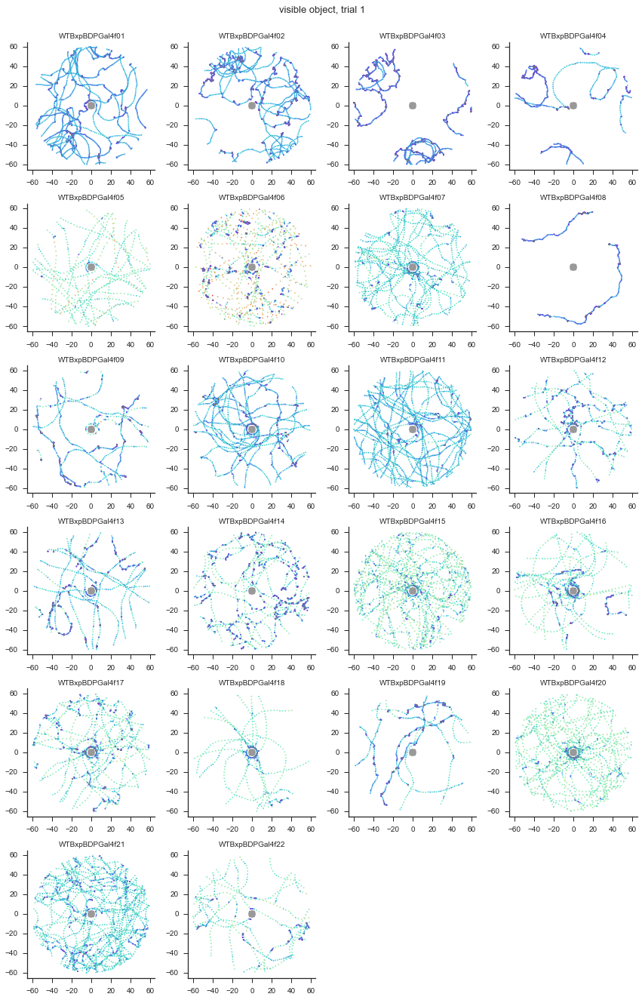

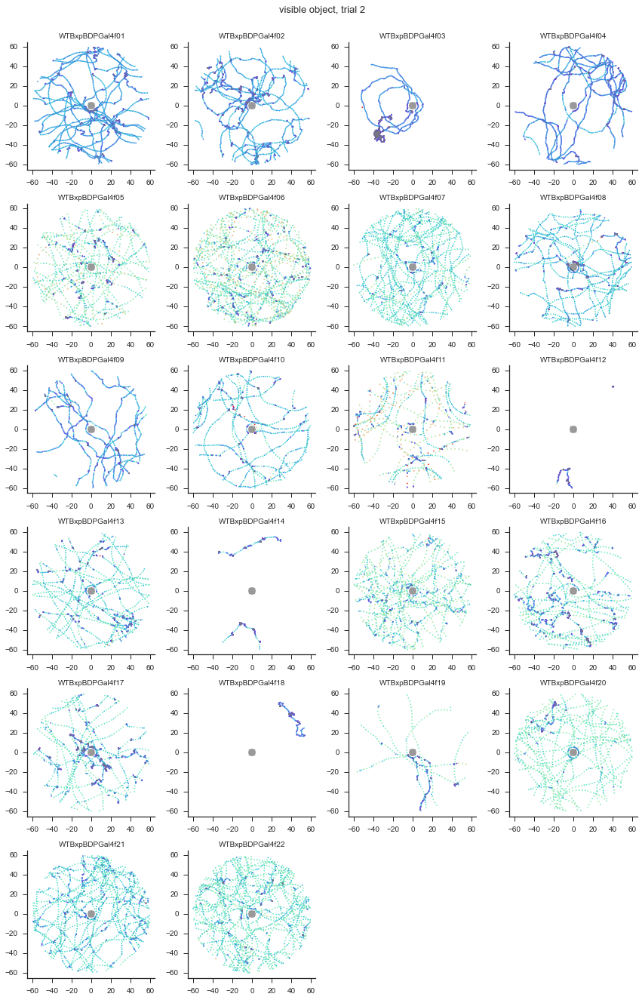

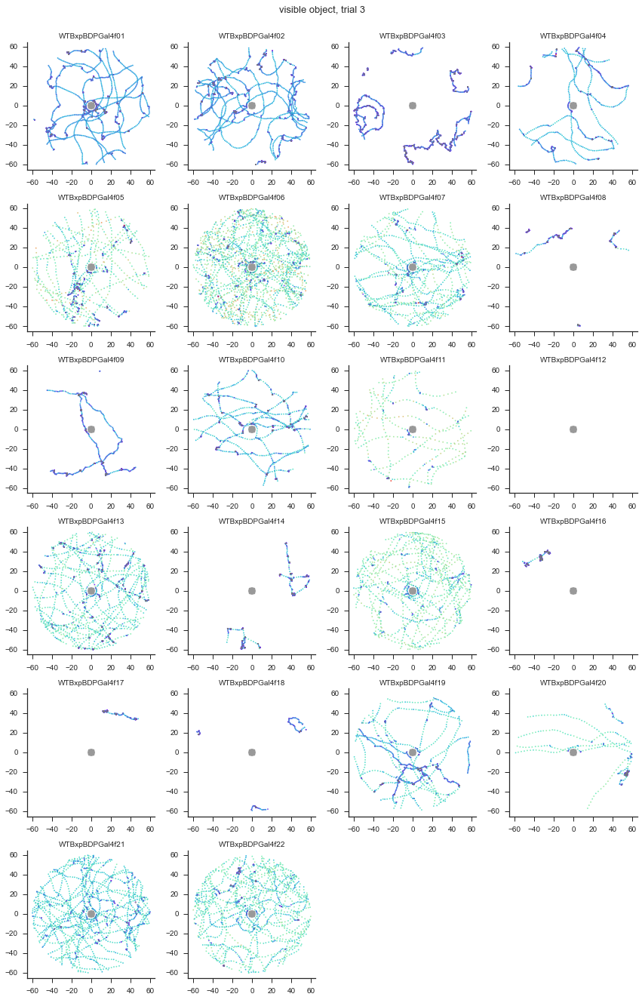

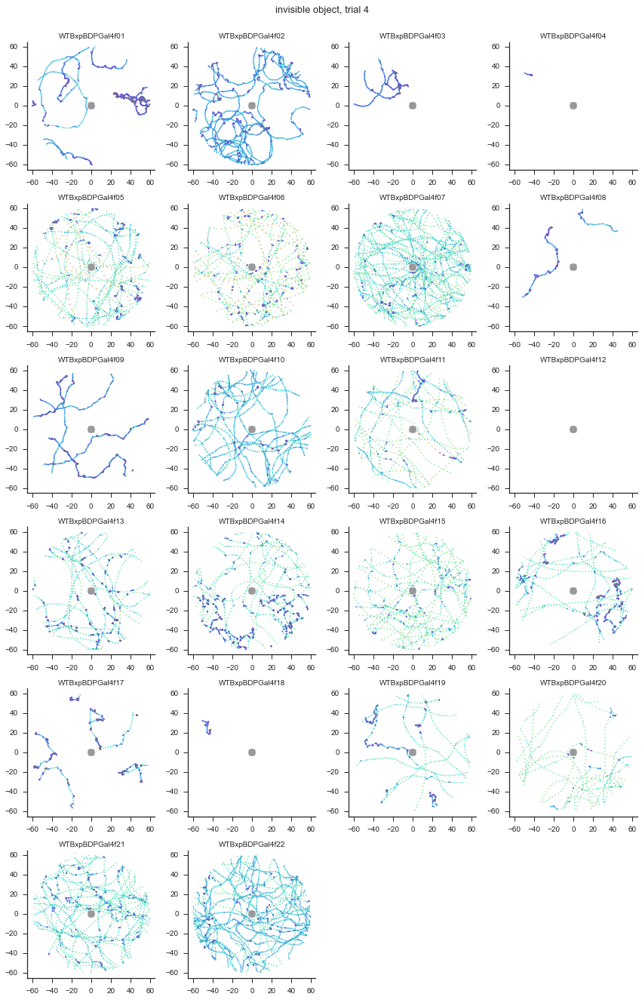

In [103]:
nrows = np.ceil(numFlies/4.0)

for ttind,trialtype in enumerate(visibilityState):
    multiflyTracePlot = plt.figure(figsize=(12,3*nrows))
    figtitle = multiflyTracePlot.suptitle(trialtype + ' object, trial '+str(ttind+1) ,fontsize=13,y=1.02)
    for fly in range(numFlies):
        multiflyTracePlot_sbplt = multiflyTracePlot.add_subplot(nrows,4,fly+1)
       
        querystring = '(trialtype=="' + trialtype + '") & (trial==' + str(ttind+1) + ') & (flyID =="' + flyIDs[fly] +  '")'

        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze()
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze()
        perFlyvT = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze()
        
        selectPts = range(0,len(perFlyX),4)
        multiflyTracePlot_sbplt.plot(perFlyX[selectPts],perFlyY[selectPts],'.',markersize=3,color='grey',alpha=0.2)
        multiflyTracePlot_sbplt.scatter(perFlyX[selectPts],perFlyY[selectPts],s=3, c=perFlyvT[selectPts], cmap='rainbow',
                                        vmin=-1, vmax=35, edgecolor='none',alpha=0.9)
        multiflyTracePlot_sbplt.plot(0,0,'o',markersize=10, color='black', alpha=0.4)
        
        myAxisTheme(multiflyTracePlot_sbplt)
        multiflyTracePlot_sbplt.set_title(flyIDs[fly],fontsize=10)
        multiflyTracePlot_sbplt.set_aspect('equal')
        multiflyTracePlot_sbplt.set_xlim(-arenaRad-5, arenaRad + 5)
        multiflyTracePlot_sbplt.set_ylim(-arenaRad-5, arenaRad + 5)
        
    multiflyTracePlot.tight_layout()
    
    multiflyTracePlot.savefig(analysisDir + 'tracePlotMA/'  + genotypeSex + '_' + trialtype
                              + '_traceVeloColored_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf', 
                              bbox_extra_artists=(figtitle,), bbox_inches='tight')

### Optional: Select flies that walk for a minumum of X% of the trial

In [12]:
for fly in range(numFlies):
    querystring = '(flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 30.0:
        #print(percentMoving)
        print(flyIDs[fly]) 

WTBxpBDPGal4m01
WTBxpBDPGal4m02
WTBxpBDPGal4m03
WTBxpBDPGal4m05
WTBxpBDPGal4m06
WTBxpBDPGal4m07
WTBxpBDPGal4m09
WTBxpBDPGal4m10
WTBxpBDPGal4m11
WTBxpBDPGal4m12
WTBxpBDPGal4m13
WTBxpBDPGal4m14
WTBxpBDPGal4m16
WTBxpBDPGal4m17
WTBxpBDPGal4m18
WTBxpBDPGal4m19
WTBxpBDPGal4m20
WTBxpBDPGal4m21


In [66]:
trial = 0
for fly in range(numFlies):
            
    querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 25.0:
        print(flyIDs[fly] + ' trial '+ str(trial+1))        

WTBf01 trial 1
WTBf02 trial 1
WTBf06 trial 1
WTBf07 trial 1
WTBf09 trial 1
WTBf10 trial 1
WTBf11 trial 1
WTBf13 trial 1
WTBf14 trial 1
WTBf18 trial 1
WTBf19 trial 1
WTBf20 trial 1


## Velocity and relative heading distribution

In [21]:
histRangeVT = (vTransTH, 30)
histRangeVR = (-5,5)
numBins = 25

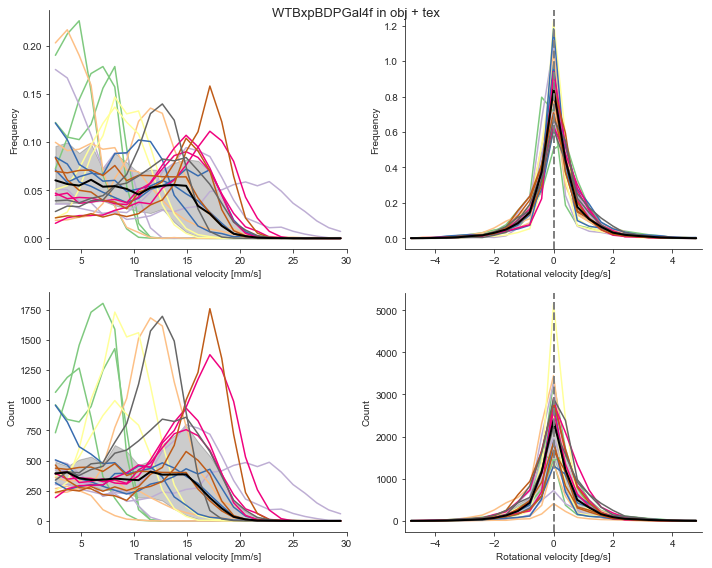

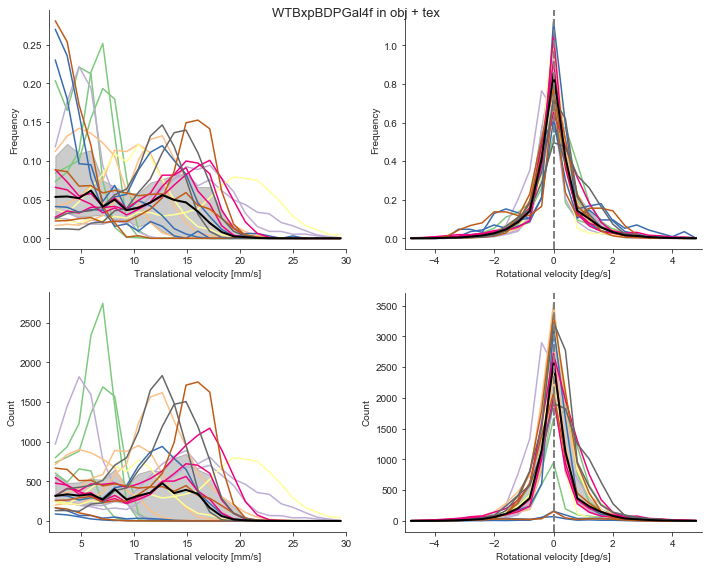

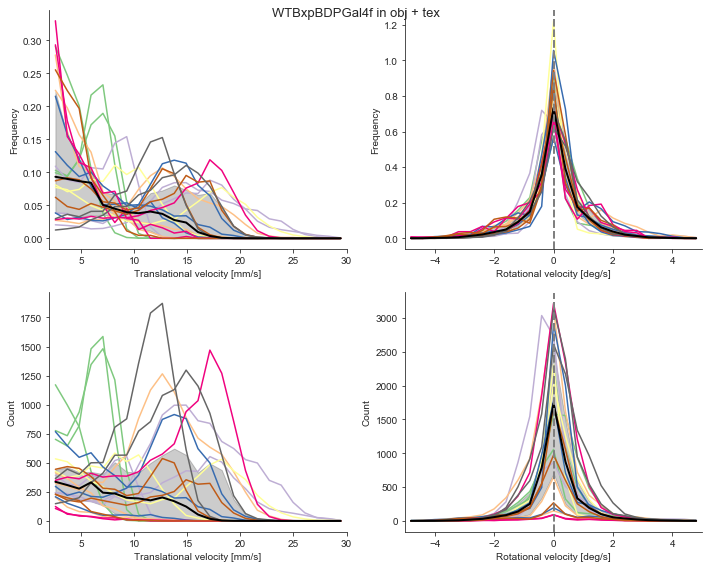

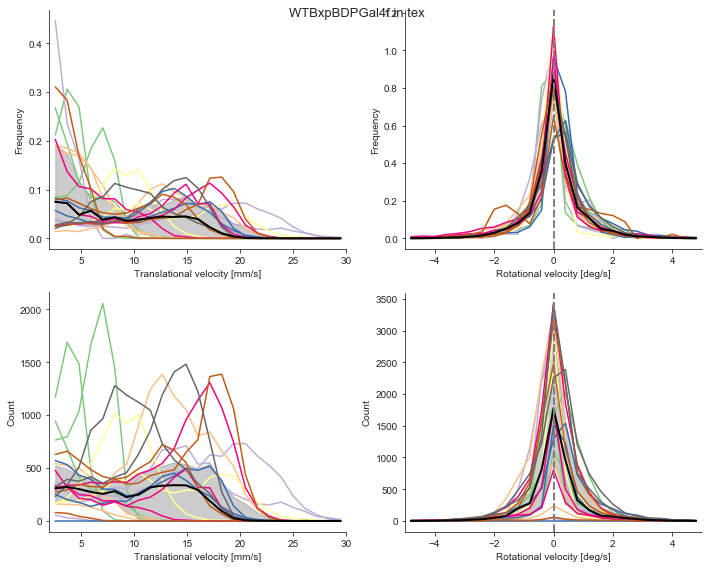

In [20]:
for scene, scenename in enumerate(trialName):
    scene_df = FOAllFlies_df.query('trial == '+ str(scene+1) +'')
    
    titleString = genotypeSex+' in '+ scenename
    
    walkingFig = plotWalkingVelocityDistr(scene_df, flyIDs, flyCMap, histRangeVT, histRangeVR, numBins)
    walkingFig.suptitle(titleString, fontsize=13)
    walkingFig.tight_layout()

    walkingFig.savefig(analysisDir + sep + 'velocityTraces' + sep + genotypeSex + '_walkingVelocities_'+scenename+\
                       '_medianIQR_n'+str(numFlies)+'.pdf', format = 'pdf')

/Users/haberkernh/Documents/code/plottingUtilities/plotsWithDataframe.py:447: RuntimeWarning: invalid value encountered in divide
  toPlot = nhAll_sorted/(np.tile(np.sum(nhAll_sorted, 0), (len(nh), 1)))


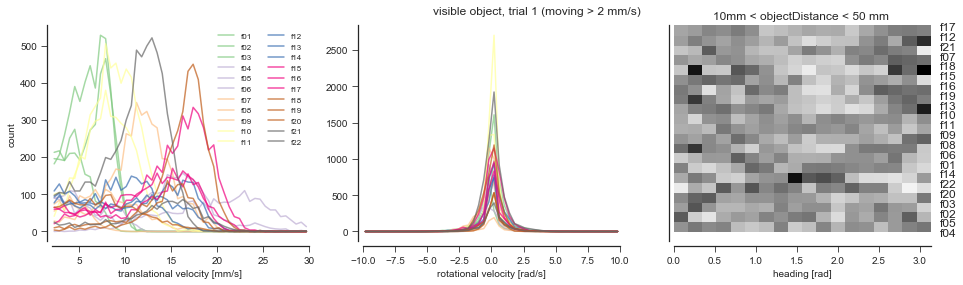

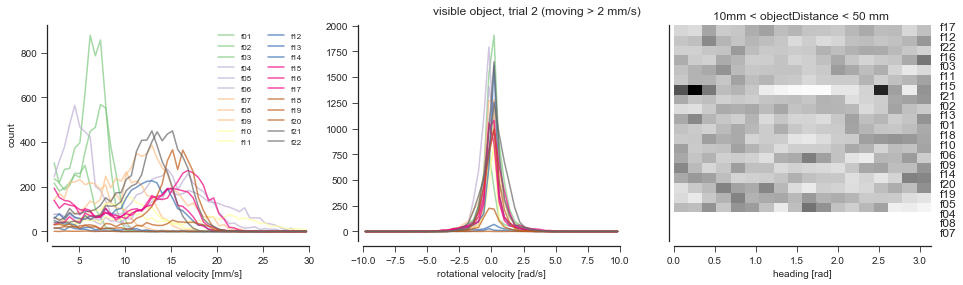

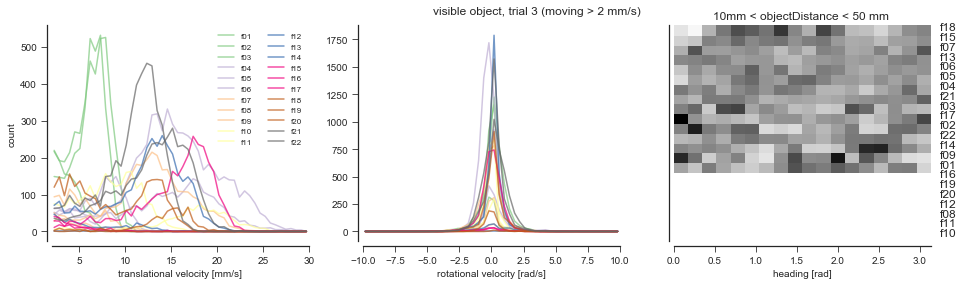

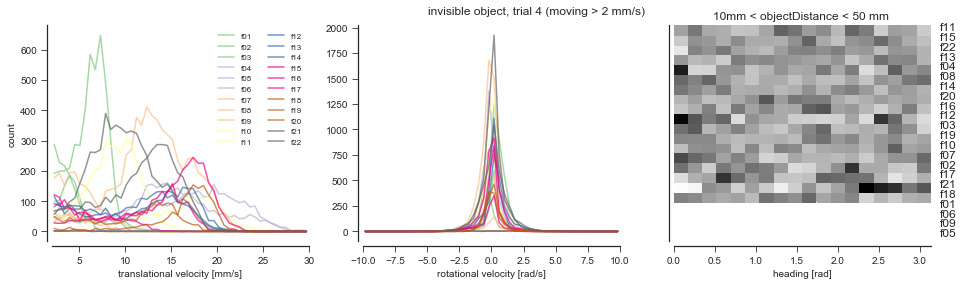

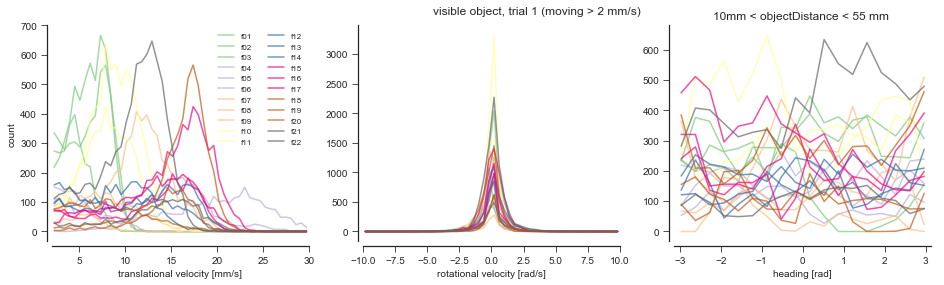

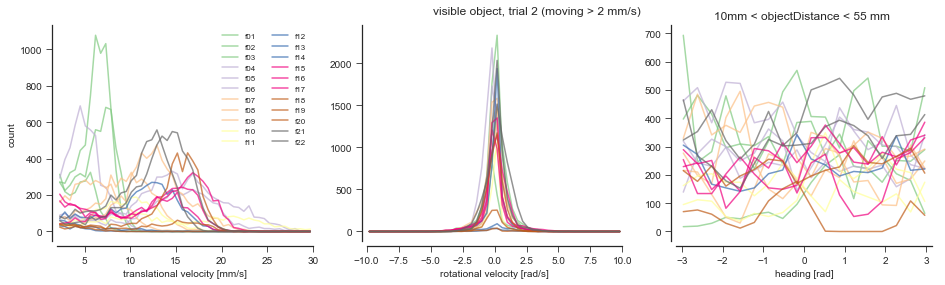

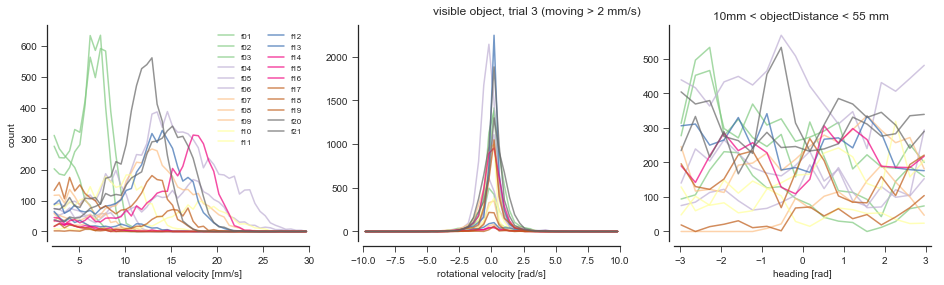

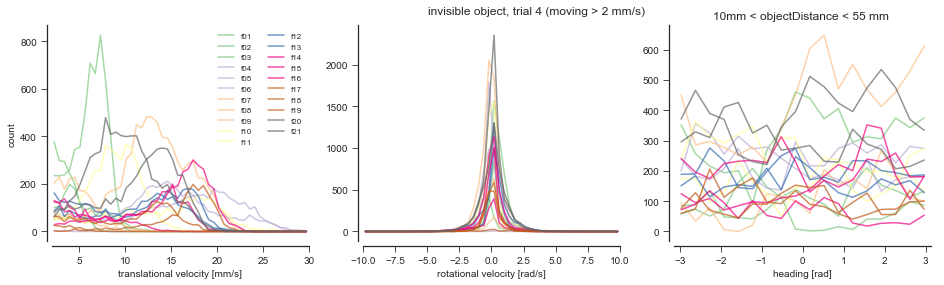

In [13]:
for ttind,trialtype in enumerate(visibilityState):
    
    veloDistFig = plotVeloHeadingDistribution_flyVR_df(FOAllFlies_df, trialtype, str(ttind+1), flyIDs, keylistLong,
                                                       vTransTH, 10, 50)
    veloDistFig.tight_layout()
    
    veloDistFig.savefig(analysisDir + 'velocityTraces/'  + genotypeSex + '_' + trialtype
                        + '_veloDistributions_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')
    
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df, 'all',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'  + genotypeSex + '_' + trialtype
                        + '_veloDistributions2_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

In [24]:
FOAllFlies_df.head()

,flyID,trial,trialtype,moving,walking,curvature,gamma,gammaFull,headingAngle,objectDistance,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena
0,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,-0.000004,NaN,0.050578,0.000000,0.0,60.622,NaN,35.0,NaN
1,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.050006,0.0,60.622,NaN,35.0,NaN
2,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.100012,0.0,60.622,NaN,35.0,NaN
3,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.150018,0.0,60.622,NaN,35.0,NaN
4,WTBxpBDPGal4f01,1.0,visible,0.0,NaN,NaN,NaN,NaN,0.002525,NaN,0.000000,0.200023,0.0,60.622,NaN,35.0,NaN


In [54]:
def plotVeloHeadingDistribution3_flyVR_df(mydf, trialtype, trial, flyIDs, vTransTH,):
    """ Plot velocity and relative heading distributions (non-normalised) for a set of flies """
    from scipy import interpolate as itp
    
    numFlies = len(flyIDs)
    flyCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=numFlies), cmap='Accent')

    maxVT = 50
    numBins = 25
    vRotRange = (-5, 5)
    angleRange = (-np.pi, np.pi)
    nhBins = 18

    veloDistFig = plt.figure(figsize=(15, 4))

    gs = gridspec.GridSpec(1, 4, width_ratios=(4, 4, 4, 1.25))

    vTsubplt = veloDistFig.add_subplot(gs[0])
    vTsubplt.set_xlabel('translational velocity [mm/s]')
    vTsubplt.set_ylabel('Frequency')
    sns.despine(right=True, offset=5, trim=False)
    sns.axes_style({'axes.linewidth': 1, 'axes.edgecolor': '.8'})

    vRsubplt = veloDistFig.add_subplot(gs[1])
    vRsubplt.set_xlabel('rotational velocity [rad/s]')
    sns.despine(right=True, offset=5, trim=False)
    sns.axes_style({'axes.linewidth': 1, 'axes.edgecolor': '.8'})

    hsubplt = veloDistFig.add_subplot(gs[2])
    hsubplt.set_xlabel('heading [rad]')
    sns.despine(right=True, offset=5, trim=False)
    sns.axes_style({'axes.linewidth': 1, 'axes.edgecolor': '.8'})

    flyIDsShort = []
    
    nh_allFlies = np.nan*np.ones((len(flyIDs),nhBins))

    for flyInd, flyID in enumerate(flyIDs):
        querystring = '(flyID == "' + flyID + '")'        
        time = mydf.query(querystring)['time'].values.squeeze()        
        if len(time) == 0:
            continue

        tV = mydf.query(querystring)['transVelo'].values.squeeze()
        rV = mydf.query(querystring)['rotVelo'].values.squeeze()
        h = mydf.query(querystring)['gammaFull'].values.squeeze()
        
        h = h[~np.isnan(h)]
        flyIDsShort.append(flyIDs[flyInd][-3:])
        
        # v trans
        ntV, binEdges=np.histogram(tV, bins=numBins, range=(vTransTH, maxVT),density=True)
        bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
        vTsubplt.plot(bincenters, ntV, alpha=0.7, color=flyCMap.to_rgba(flyInd))

        # v rot
        nrV, binEdges = np.histogram(rV, bins=numBins, range=vRotRange,density=True)
        bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
        vRsubplt.plot(bincenters, nrV, alpha=0.7, color=flyCMap.to_rgba(flyInd))

        # heading
        nh, binEdges = np.histogram(h, bins=nhBins, range=angleRange,density=True)
        nh_norm = nh/np.sum(nh)
        bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
        
        #only include flies that were moving for more than 20% of time
        if np.sum(tV>vTransTH) > 0.2*len(tV): 
            hsubplt.plot(bincenters, nh_norm, alpha=0.7, color=flyCMap.to_rgba(flyInd))
            nh_allFlies[flyInd,:] = nh_norm

    hsubplt.plot(bincenters,np.nanmedian(nh_allFlies,0),color='k',alpha=0.6,linewidth=2)
    [var1,var2] = np.nanpercentile(nh_allFlies,[25,75],axis=0)
    hsubplt.fill_between(bincenters, var1, var2, color='k', alpha=0.2)

    hsubplt.set_title(str(minDist) + 'mm < objectDistance < ' + str(maxDist) + ' mm ')

    vTsubplt.set_xlim((vTransTH, maxVT))
    vTsubplt.set_ylim(0,0.2)
    vRsubplt.set_xlim(vRotRange)
    vRsubplt.set_ylim(0,1.1)
    hsubplt.set_xlim(angleRange)
    hsubplt.set_ylim(0,0.2)

    veloDistFig.suptitle(trialtype+' object, trial '+trial+' (moving > '+str(vTransTH)+' mm/s)', fontsize=12)
    vTsubplt.legend(flyIDsShort, ncol=2, loc=1, fontsize=8, frameon=False)

    return veloDistFig

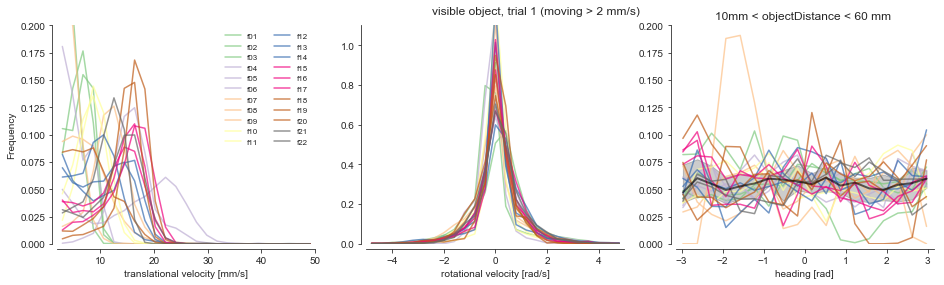

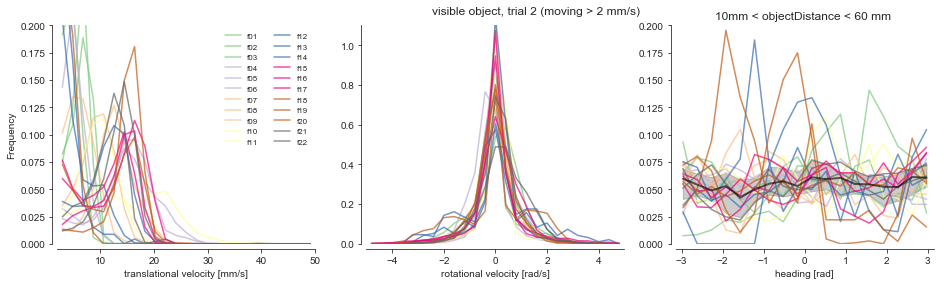

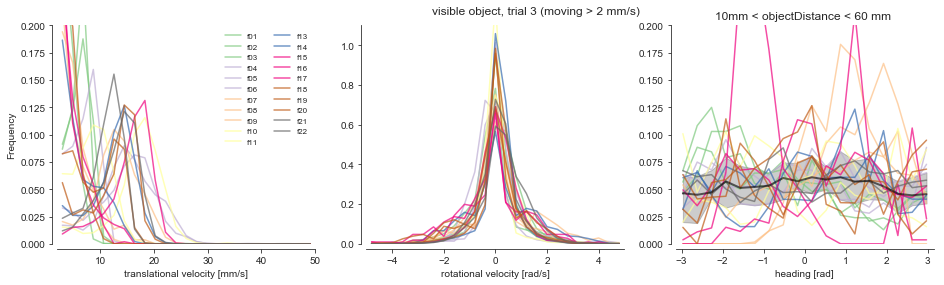

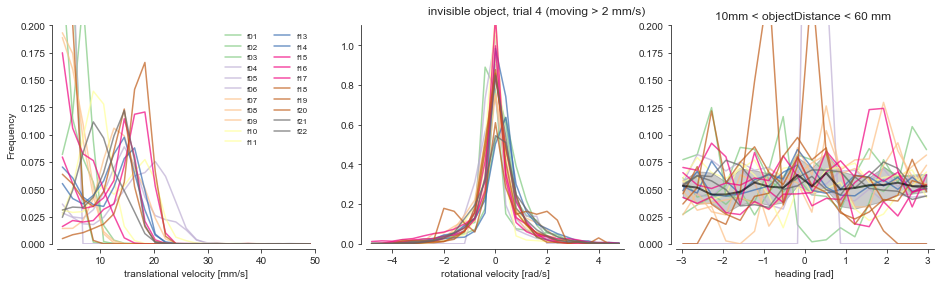

In [55]:
# object distance
minDist = 10
maxDist = 60

for ttind,trialtype in enumerate(visibilityState):
    querystring = '(moving>0)&(objectDistance>'+str(minDist)+')&(objectDistance<'+str(maxDist)\
                        +')&(trialtype == "' + trialtype + '") & (trial==' + str(ttind+1) + ')'
    trialdf = FOAllFlies_df.query(querystring)
    veloDistFig = plotVeloHeadingDistribution3_flyVR_df(trialdf,trialtype, str(ttind+1), flyIDs,vTransTH)
    veloDistFig.tight_layout()
    
    veloDistFig.savefig(analysisDir + 'velocityTraces/'+genotypeSex+'_'+trialtype
                        +'_veloDistributions3_trial'+str(ttind+1)+'_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

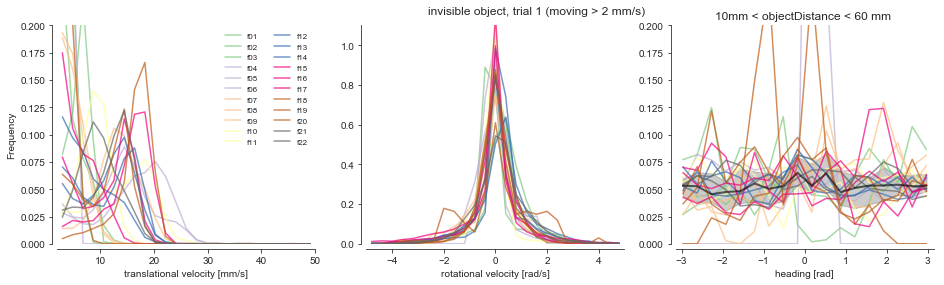

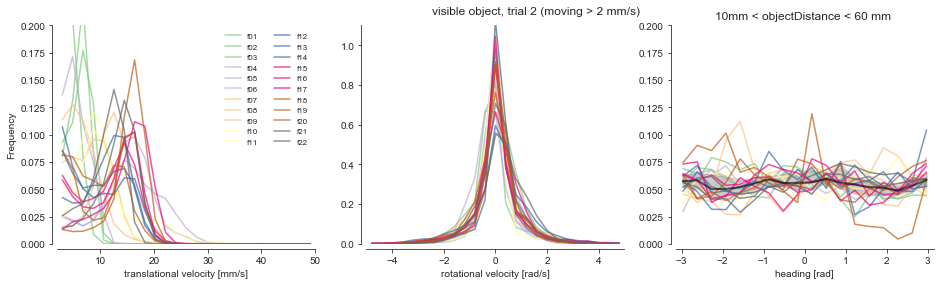

In [56]:
for ttind,trialtype in enumerate(list(set(visibilityState))):
    querystring = '(moving>0)&(objectDistance>'+str(minDist)+')&(objectDistance<'+str(maxDist)\
                        +')&(trialtype == "' + trialtype + '")'
    trialdf = FOAllFlies_df.query(querystring)
    
    veloDistFig = plotVeloHeadingDistribution3_flyVR_df(trialdf,trialtype,str(ttind+1),flyIDs,vTransTH)
    veloDistFig.tight_layout()
    
    veloDistFig.savefig(analysisDir + 'velocityTraces/'  + genotypeSex + '_' + trialtype
                        + '_veloDistributions4_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

## Compute circular statistics on heading distribution

fly WTBxpBDPGal4f04 not moving: 18.5881485577
fly WTBxpBDPGal4f08 not moving: 10.0195913798
Analysis directory already exists.


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/matplotlib/projections/polar.py:65: RuntimeWarning: invalid value encountered in less
  mask = r < 0


fly WTBxpBDPGal4f12 not moving: 3.4172147555
fly WTBxpBDPGal4f14 not moving: 5.58768849411
fly WTBxpBDPGal4f18 not moving: 8.23231409445
Analysis directory already exists.
fly WTBxpBDPGal4f08 not moving: 4.50992817913
fly WTBxpBDPGal4f09 not moving: 12.1930161167
fly WTBxpBDPGal4f12 not moving: 0.0
fly WTBxpBDPGal4f14 not moving: 8.97632229945
fly WTBxpBDPGal4f16 not moving: 2.59816947151
fly WTBxpBDPGal4f17 not moving: 3.25405277482
fly WTBxpBDPGal4f18 not moving: 3.67663344408
fly WTBxpBDPGal4f20 not moving: 17.2974663747
Analysis directory already exists.
fly WTBxpBDPGal4f04 not moving: 0.317124735729
fly WTBxpBDPGal4f08 not moving: 5.73666919383
fly WTBxpBDPGal4f12 not moving: 0.0
fly WTBxpBDPGal4f18 not moving: 10.2941176471
Analysis directory already exists.


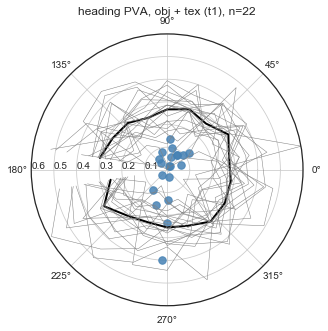

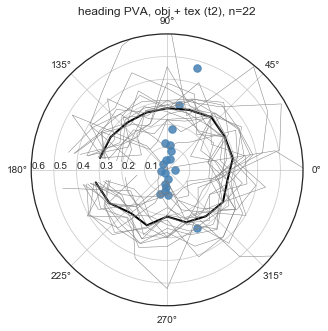

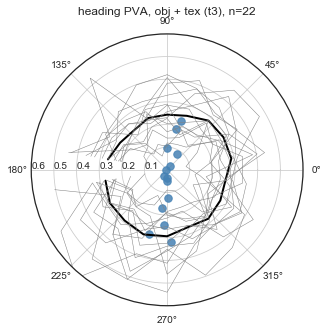

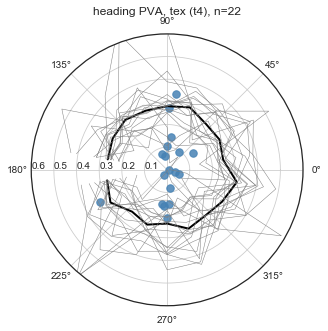

In [22]:
angleLow = -np.pi
angleHigh = np.pi

minDist = 10
maxDist = 60

numBins = 18

from scipy.stats import circmean as circmean

for trial in range(len(trialName)):
    headingPVA = np.nan*np.ones((numFlies,2))
    nheadGam = np.nan*np.ones((numFlies,numBins))
    
    for fly in range(len(flyIDs)):
        querystring = '(objectDistance>'+str(minDist)+')&(objectDistance<='+str(maxDist)\
                            +')&(trialtype== "' + visibilityState[trial] +'") &(trial==' + str(trial+1) + ') & (flyID == "' + flyIDs[fly] + '")'
        moving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int').values
        perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values

        if sum(moving)<=0.2*len(moving):
            print('fly '+str(flyIDs[fly])+' not moving: '+str(100.0*sum(moving)/max(1,len(moving))))

            continue
        gam = perFlyG[moving>0]
        meandir, meanlen = circmeanvec(gam[~np.isnan(gam)],np.ones(len(gam[~np.isnan(gam)])), high=angleHigh, low=angleLow)

        headingPVA[fly,0] = meandir
        headingPVA[fly,1] = meanlen
        
        histRange = (angleLow,angleHigh)
        nhead, edges = np.histogram(gam,density=True,range=histRange,bins=numBins)
        nheadGam[fly,:] = nhead/nhead.sum()
        fulledges = edges[:-1]+np.diff(edges)/2


    try:
        mkdir(analysisDir + sep + 'circStats' + sep)
    except OSError:
        print('Analysis directory already exists.')

    np.savetxt(analysisDir + 'circStats/'  + genotype + '_headingPVA_dir_trial'+str(trial+1)+'_n'+ str(numFlies) +'.csv',
               headingPVA[:,0], delimiter=',')
    np.savetxt(analysisDir + 'circStats/'  + genotype + '_headingPVA_len_trial'+str(trial+1)+'_n'+ str(numFlies) +'.csv',
               headingPVA[:,1], delimiter=',')

    PVAFig = plt.figure(figsize=(5,5))

    ax = PVAFig.add_subplot(111,projection='polar')
    ax.plot(headingPVA[:,0],headingPVA[:,1],'.',markersize=15,color='steelblue',alpha=0.85)
    meandir, meanlen = circmeanvec(headingPVA[:,0],headingPVA[:,1], high=angleHigh, low=angleLow)
    ax.plot(meandir,meanlen,'o', color='black',alpha=1, markersize=10)
    ax.set_rlim(0,0.6)
    ax.set_rlabel_position(180)
    ax.set_title('heading PVA, '+trialName[trial]+' (t' + str(trial+1) + '), n='+str(numFlies))
    
    ax.plot(fulledges,np.nanmedian(nheadGam[:,:],0)*5,color='k',linewidth=2)
    for fly in range(numFlies):
        ax.plot(fulledges,nheadGam[fly,:]*5,color='grey',linewidth=0.5)
        
    PVAFig.savefig(analysisDir + 'circStats/'  + genotype
                   + '_headingPVA_trial'+str(trial+1)+'_n'+ str(numFlies) +'.pdf', format='pdf') 

## Residency plots

### 2D residency

Plot directory already exists


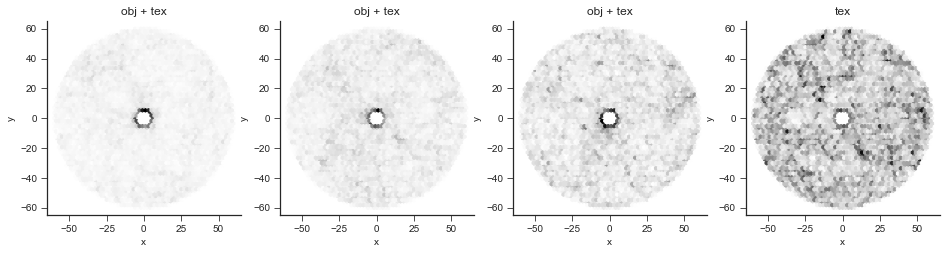

In [24]:
numBins = 60

keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_vT = keylistLong.index('transVelo')

hexplotfig = plt.figure(figsize=(16,4))
for trial, condition in enumerate(trialName):
    querystring = '(trial == ' + str(trial+1) + ') & (moving > 0)'
    xPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    ax = hexplotfig.add_subplot(1,4,trial+1)
    ax.hexbin(xPosMA, yPosMA, gridsize=numBins, cmap='Greys')
    plt.xlabel('x'); plt.ylabel('y')
    ax.set_xlim(-arenaRad-5, arenaRad+5); ax.set_ylim(-arenaRad-5, arenaRad+5)
    ax.set_title(trialName[trial])
    ax.set_aspect('equal')
    myAxisTheme(ax)

try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')
hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                   +'_residencyMA_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

### 1D resiceny (along readial distance from object)

ValueError: range parameter must be finite.

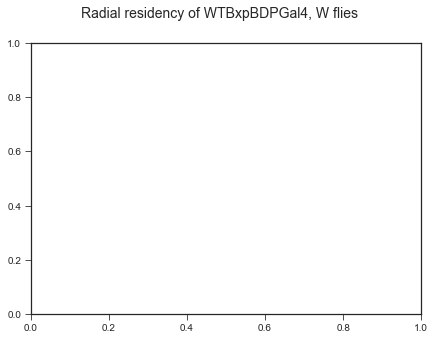

In [26]:
movementFilter = 'moving > 0'
numBins = 55
histRange = (5,arenaRad)
varStyle = 'iqr' #'std', 'iqr' 'dotplot'
fill = False

# log residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, True, varStyle, fill, trialName)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_log_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

# linear residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, False, varStyle, True, trialName)
myAxisTheme(radResPlt)
radResPlt.set_ylim(0,1.5)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_lin_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Distance vs. relative heading

#### Mountain diagram: Heading angle distribtion histogram over distance bins

#### 2D (polar) residency: heading vs. distance

Plot directory already exists
Plot directory already exists
Plot directory already exists
Plot directory already exists


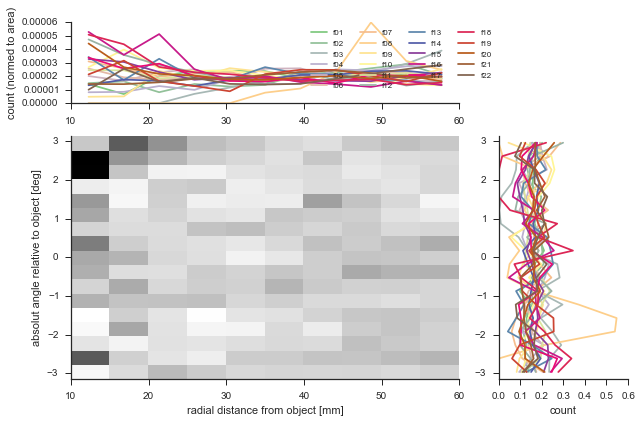

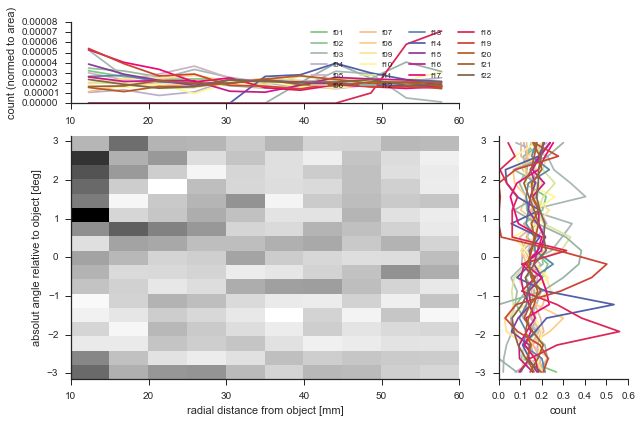

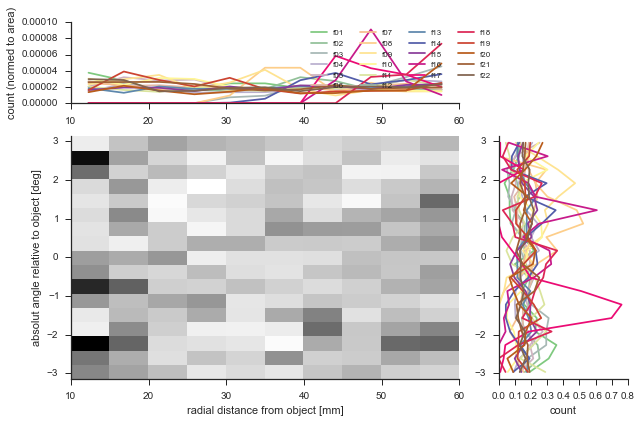

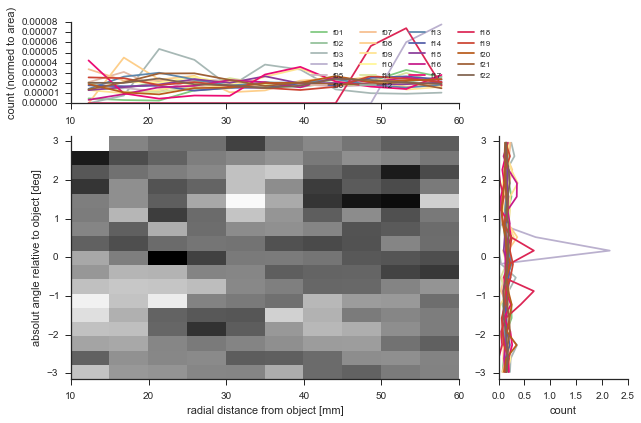

In [122]:
# plot parameter
distBins = 11
angleBins = 18 #36 # 
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)
    
    try:
        mkdir(analysisDir + 'headingVsDistance/')
    except:
        print('Plot directory already exists')
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_coarse_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

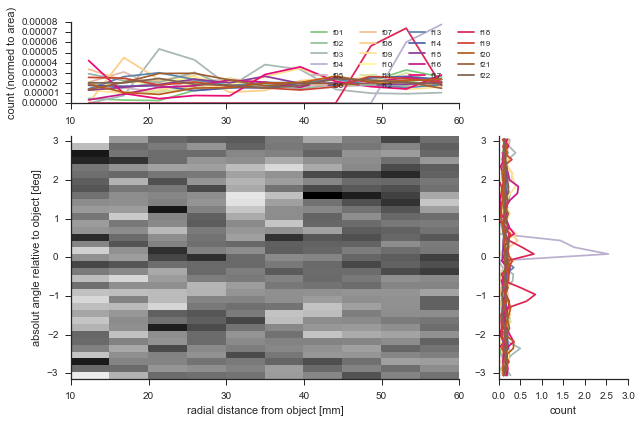

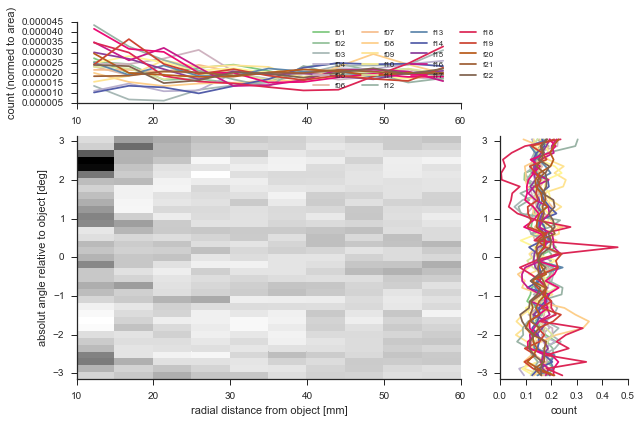

In [123]:
# plot parameter
distBins = 11
angleBins = 36 # 18 #
maxDist = arenaRad
minDist = 10

for ttind,trialtype in enumerate(list(set(visibilityState))):
    querystring = '(trialtype == "'+trialtype+'")'+\
        '& (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()

    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    
    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)

    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

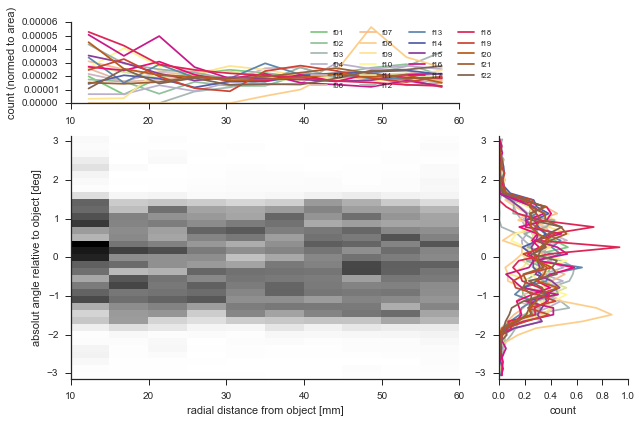

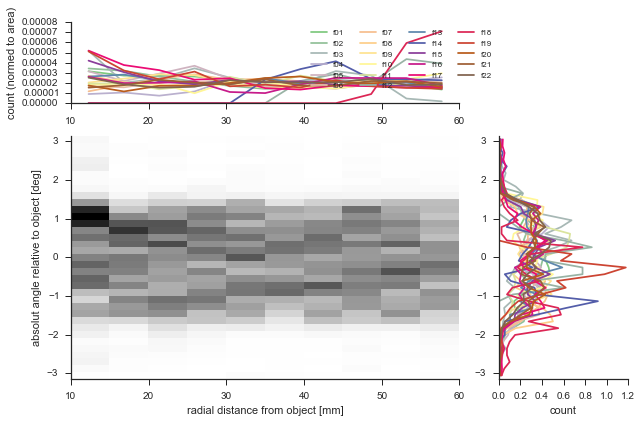

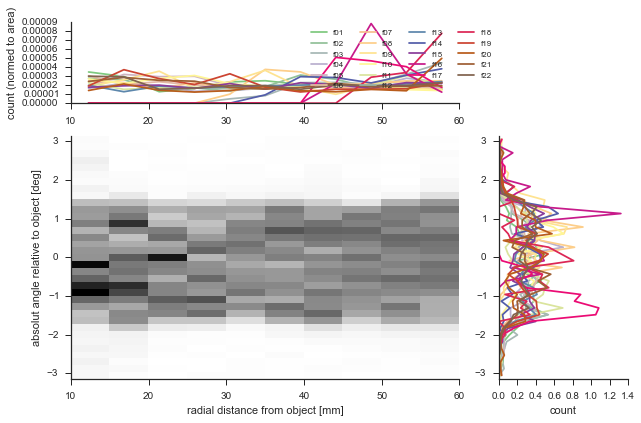

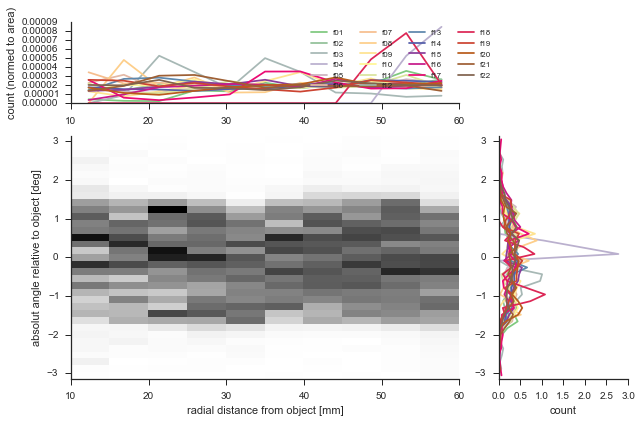

In [124]:
# plot parameter
distBins = 11
angleBins = 36
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist<0],
                                           objDistMAall[d_objDist<0],gammaFullall[d_objDist<0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_apr_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

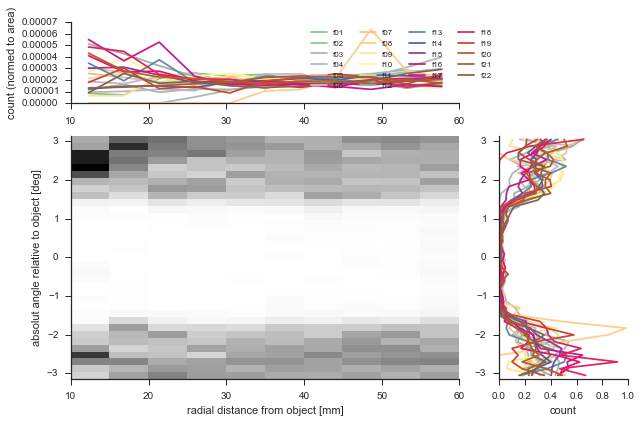

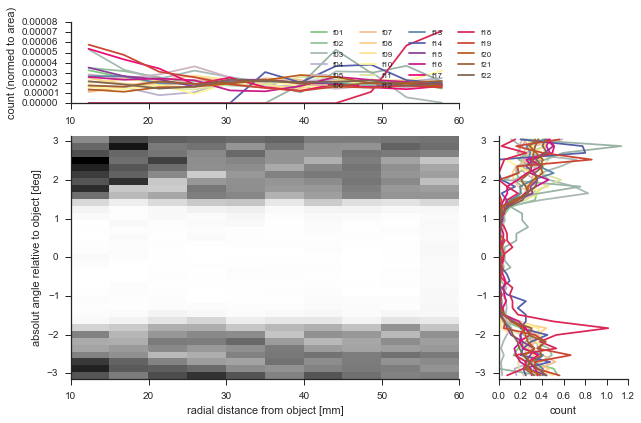

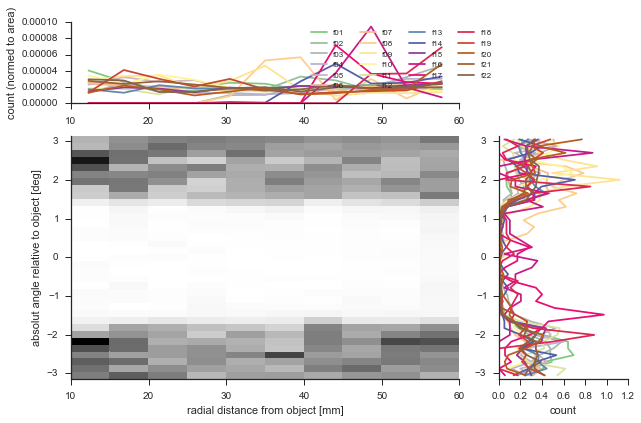

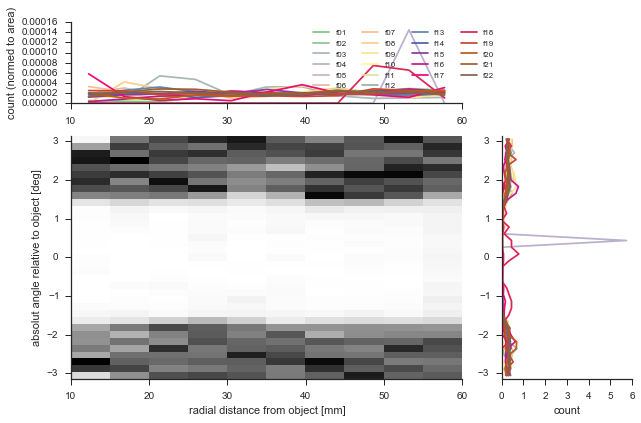

In [125]:
# plot parameter
distBins = 11
angleBins = 36
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist>0],
                                           objDistMAall[d_objDist>0],gammaFullall[d_objDist>0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_dep_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

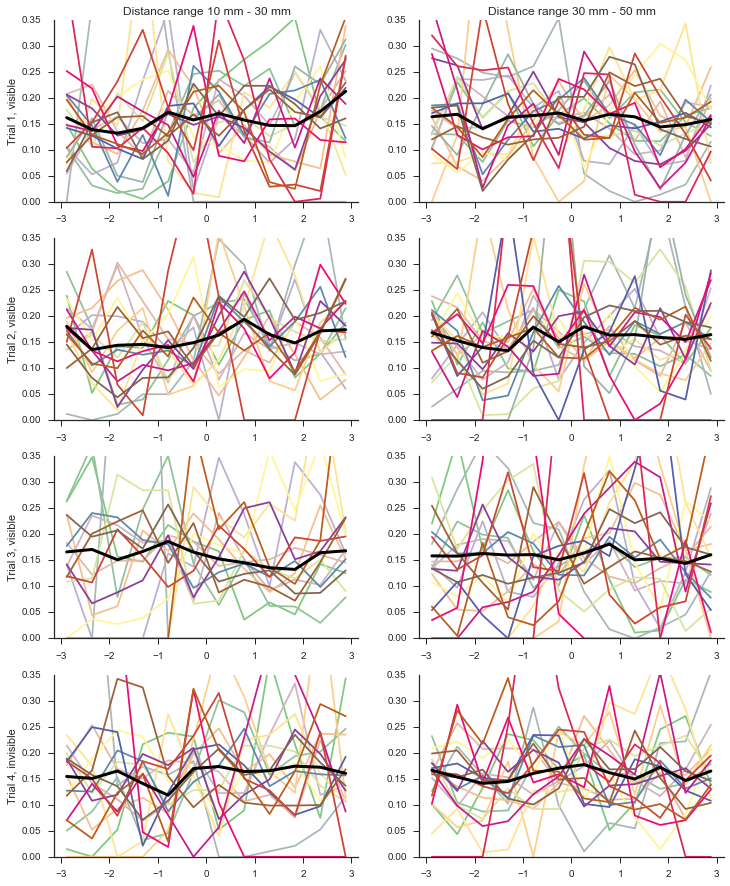

In [126]:
# plot parameter
distBins = 11
angleBins = 12
angleEdges = np.linspace(-np.pi, np.pi, angleBins)

angleFig = plt.figure(figsize=(12,15))

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    numFlies = len(flyIDs)
    flyCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=numFlies), cmap='Accent')

    minDist = 10
    maxDist = 30
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    sbplt = angleFig.add_subplot(4,2,ttind*2+1)

    for fly in range(numFlies):
        n, edges = np.histogram(gammaFullall[flyIDallarray == flyIDs[fly]],
                                range=(min(angleEdges), max(angleEdges)), bins=angleBins, normed=True)
        edgeCenteres = edges[:-1]+np.mean(np.diff(edges))/2
        sbplt.plot(edgeCenteres, n, color=flyCMap.to_rgba(fly))
        
    n, edges = np.histogram(gammaFullall, range=(min(angleEdges),
                            max(angleEdges)), bins=angleBins, normed=True, density=True)
    sbplt.plot(edgeCenteres, n, color='k',linewidth = 3)
        
    sbplt.set_ylabel('Trial '+str(ttind+1)+', '+trialtype)
    sbplt.set_xlim(min(angleEdges), max(angleEdges))
    sbplt.set_ylim(0, 0.35)
    if(ttind==0):
        sbplt.set_title('Distance range '+str(minDist)+' mm - '+str(maxDist)+' mm')
    myAxisTheme(sbplt)
    
    minDist = 30
    maxDist = 50
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    sbplt = angleFig.add_subplot(4,2,ttind*2+2)

    for fly in range(numFlies):
        n, edges = np.histogram(gammaFullall[flyIDallarray == flyIDs[fly]],
                                range=(min(angleEdges), max(angleEdges)), bins=angleBins, normed=True, density=True)
        edgeCenteres = edges[:-1]+np.mean(np.diff(edges))/2
        sbplt.plot(edgeCenteres, n, color=flyCMap.to_rgba(fly))

    n, edges = np.histogram(gammaFullall, range=(min(angleEdges),
                            max(angleEdges)), bins=angleBins, normed=True)
    sbplt.plot(edgeCenteres, n, color='k',linewidth = 3)
    
    sbplt.set_xlim(min(angleEdges), max(angleEdges))
    sbplt.set_ylim(0, 0.35)
    myAxisTheme(sbplt)
    if(ttind==0):
        sbplt.set_title('Distance range '+str(minDist)+' mm - '+str(maxDist)+' mm')

angleFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                 + '_headingVsDistance_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                format='pdf')

## Analysis of steering maneuvres and their relationship with the object location

### Turnrate relative to object distance

Plot directory already exists


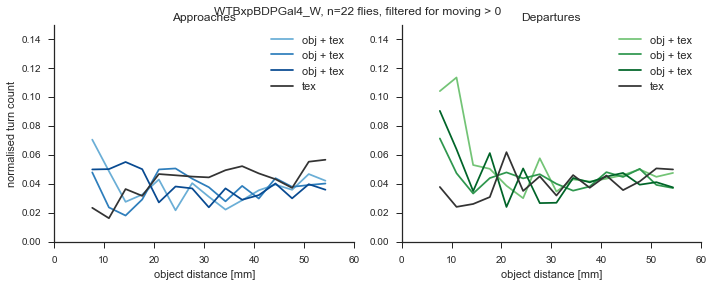

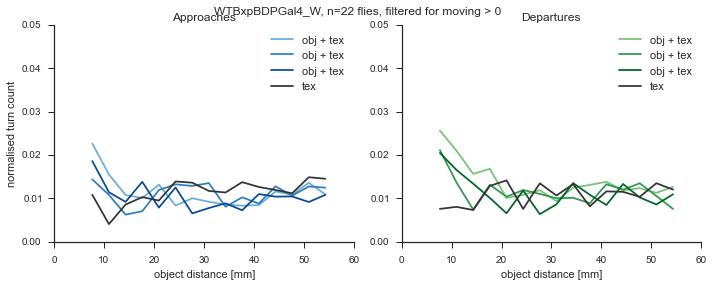

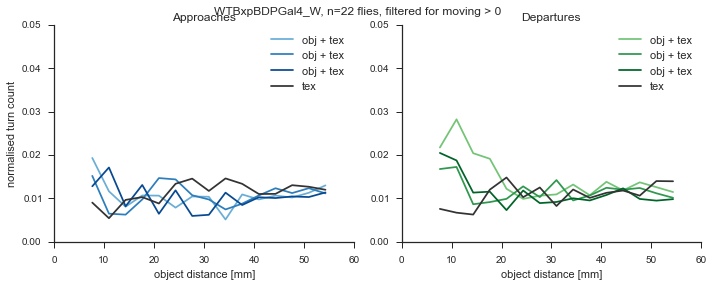

In [128]:
numBins = 15#10
useTurnIndex = False
movementFilter='moving > 0'

try:
    mkdir(analysisDir + 'turnRates/')
except:
    print('Plot directory already exists')

useTurnChange = 0

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.15)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
            + '_turnRatePerDistance_aboveTH'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = 1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.05)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
            + '_turnRatePerDistance_turnStart'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = -1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.05)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
            + '_turnRatePerDistance_turnEnd'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Change in rel. object heading before and after turns
###    --> generally decreasing?
###    --> bin values over different distance rings

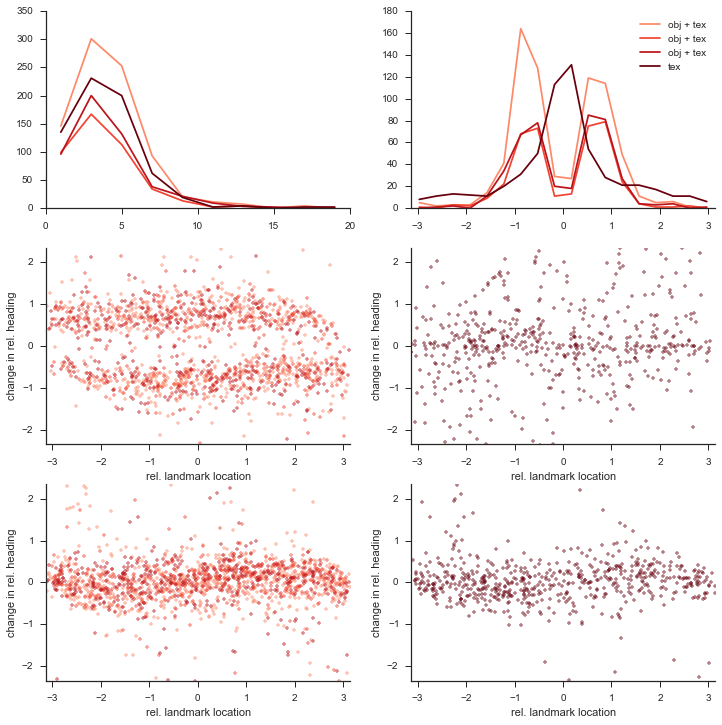

In [90]:
arenaRad = 60
useTurnIndex = False
useTurnChange = 1 #1 -- start of turn, -1 -- end of turn
movementFilter = 'moving > 0'
numVisTrials = 3
numInvTrials = 1

# Find turnTH over all flies
querystring = '('+movementFilter+') & (objectDistance>6)'
vRot = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vR:keyind_vR+1]).squeeze()

if useTurnIndex:
    vtrans = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vT:keyind_vT+1]).squeeze()
    vRot_filt = np.convolve(vRot/vtrans, np.ones((5,))/5, mode='same')
    vRot_filt[np.isinf(abs(vRot_filt))] = 0.0
else:
    vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')

turnTH_pos = 3*np.nanstd(vRot_filt[vRot_filt >= 0])
turnTH_neg = -3*np.nanstd(vRot_filt[vRot_filt <= 0])
turnTH = 3*np.nanstd(abs(vRot_filt))

turnEffectFig = plt.figure(figsize=(12,12))
turnLenghtPlt = turnEffectFig.add_subplot(321)
deltaHeadPlt = turnEffectFig.add_subplot(322)
visHeadVsChangePlt = turnEffectFig.add_subplot(323)
invHeadVsChangePlt = turnEffectFig.add_subplot(324)
turnLocPltPre = turnEffectFig.add_subplot(325)
turnLocPltPost = turnEffectFig.add_subplot(326)

visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(trial) for trial in range(4)]
trialCMap.append(invTrialCMap.to_rgba(0))

# Trial/fly specific values
for trial in [1,2,3,4]:

    querystring = '(trialtype=="' + visibilityState[trial-1] + '")& (trial==' + str(trial) + ') & (' + movementFilter + ') & (objectDistance>10)& (objectDistance<55)'
    xPosTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()
    vRotTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vR:keyind_vR+1]).squeeze()
    gammaFullTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_gamful:keyind_gamful+1]).squeeze()
    gammaTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_gam:keyind_gam+1]).squeeze()


    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    if useTurnIndex:
        vtrans = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vT:keyind_vT+1]).squeeze()
        vRotTrial_filt = np.convolve(vRotTrial/vtrans, np.ones((5,))/5, mode='same')
    else:
        vRotTrial_filt = np.convolve(vRotTrial, np.ones((5,))/5, mode='same')

    # separate approaches and departures
    d_objDist = np.hstack((0, np.diff(objDistTrial)))
    pts_apr = d_objDist < 0
    pts_dep = d_objDist > 0

    turns = (abs(vRotTrial_filt) > turnTH).astype('int')
    tst = np.zeros(len(turns))
    tst[1:] = np.diff(turns) == useTurnChange

    turnsL = (vRotTrial_filt > turnTH_pos).astype('int')
    tstL = np.zeros(len(turnsL))
    tstL[1:] = np.diff(turnsL) == useTurnChange

    turnsR = (vRotTrial_filt < turnTH_neg).astype('int')
    tstR = np.zeros(len(turnsR))
    tstR[1:] = np.diff(turnsR) == useTurnChange
    
    #compute turn length
    turnT = np.zeros(sum(tst))
    #interTT = np.zeros(sum(tst))
    currTurn = 0
    turnStartInds = np.where(tst>0)[0]
    for tpt in range(len(turnStartInds)):
        ctpt = turnStartInds[tpt]
        while(turns[ctpt].astype('bool') == 1):
            currTurn += 1
            ctpt += 1
        turnT[tpt] = currTurn
        currTurn = 0
    
    #make plots
    preWdw = -2
    postWdw = 8
    
    xRange = -np.pi,np.pi
    yRange = -0.75*np.pi,0.75*np.pi
    yRange2 = -0.75*np.pi,0.75*np.pi
    
    turnStMask = tst.astype('bool')
    turnStMaskSham = tst.astype('bool')
    np.random.shuffle(turnStMaskSham)
    
    hist, bin_edges = np.histogram(turnT,range=(0,20))
    turnLenghtPlt.plot(bin_edges[:-1]+np.diff(bin_edges)/2,hist,color=trialCMap[trial-1])
    turnLenghtPlt.set_xlim(0,20)
    myAxisTheme(turnLenghtPlt)
    
    deltaHead = gammaFullTrial[np.roll(turnStMask,postWdw)]-gammaFullTrial[np.roll(turnStMask,preWdw)]
    deltaHeadSham = gammaFullTrial[np.roll(turnStMaskSham,postWdw)]-gammaFullTrial[np.roll(turnStMaskSham,preWdw)]
    
    hist, bin_edges = np.histogram(deltaHead,range=(-np.pi,np.pi),bins=18)
    deltaHeadPlt.plot(bin_edges[:-1]+np.diff(bin_edges)/2,hist,color=trialCMap[trial-1])
    deltaHeadPlt.set_xlim(-np.pi, np.pi)
    myAxisTheme(deltaHeadPlt)
    
    #turnStMask = np.roll(turnStMask,34)
    if(trial < 4):
        visHeadVsChangePlt.plot(gammaFullTrial[turnStMask],deltaHead,'.',alpha=0.5,color=trialCMap[trial-1])
        visHeadVsChangePlt.set_ylabel('change in rel. heading')
        visHeadVsChangePlt.set_xlabel('rel. landmark location')
        visHeadVsChangePlt.set_xlim(xRange)
        visHeadVsChangePlt.set_ylim(yRange)
        myAxisTheme(visHeadVsChangePlt)
    else:
        invHeadVsChangePlt.plot(gammaFullTrial[turnStMask],deltaHead,'.',alpha=0.5,color=trialCMap[trial-1])
        invHeadVsChangePlt.set_ylabel('change in rel. heading')
        invHeadVsChangePlt.set_xlabel('rel. landmark location')
        invHeadVsChangePlt.set_xlim(xRange)
        invHeadVsChangePlt.set_ylim(yRange)
        myAxisTheme(invHeadVsChangePlt)

    #turnStMask = np.roll(turnStMask,34)
    if(trial < 4):
        turnLocPltPre.plot(gammaFullTrial[turnStMaskSham],deltaHeadSham,'.',alpha=0.5,color=trialCMap[trial-1])
        turnLocPltPre.set_ylabel('change in rel. heading')
        turnLocPltPre.set_xlabel('rel. landmark location')
        turnLocPltPre.set_xlim(xRange)
        turnLocPltPre.set_ylim(yRange2)
        myAxisTheme(turnLocPltPre)
    else:
        turnLocPltPost.plot(gammaFullTrial[turnStMaskSham],deltaHeadSham,'.',alpha=0.5,color=trialCMap[trial-1])
        turnLocPltPost.set_ylabel('change in rel. heading')
        turnLocPltPost.set_xlabel('rel. landmark location')
        turnLocPltPost.set_xlim(xRange)
        turnLocPltPost.set_ylim(yRange2)
        myAxisTheme(turnLocPltPost)

deltaHeadPlt.legend([trialName[trial-1] for trial in range(1,5)])

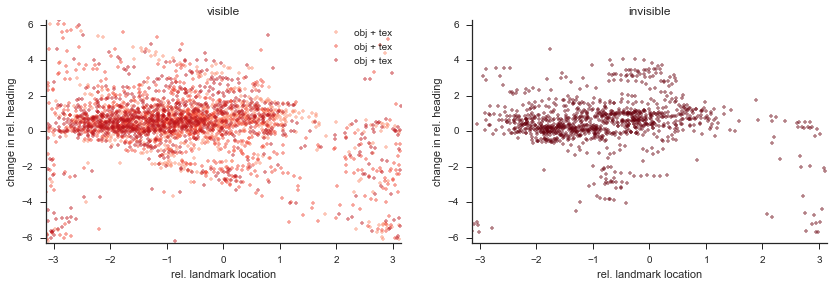

In [91]:
arenaRad = 60
movementFilter = 'moving > 0'
numVisTrials = 3
numInvTrials = 1

headingChangeFig = plt.figure(figsize=(14,4))
visiblePlt = headingChangeFig.add_subplot(121)
invisiblePlt = headingChangeFig.add_subplot(122)

visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(trial) for trial in range(4)]
trialCMap.append(invTrialCMap.to_rgba(0))


# Find turnTH over all flies
querystring = '('+movementFilter+') & (objectDistance>15)'
vRot = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vR:keyind_vR+1]).squeeze()

if useTurnIndex:
    vtrans = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vT:keyind_vT+1]).squeeze()
    vRot_filt = np.convolve(vRot/vtrans, np.ones((5,))/5, mode='same')
    vRot_filt[np.isinf(abs(vRot_filt))] = 0.0
else:
    vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')

stdTH = 2
turnTH_pos = stdTH*np.nanstd(vRot_filt[vRot_filt >= 0])
turnTH_neg = -stdTH*np.nanstd(vRot_filt[vRot_filt <= 0])
turnTH = stdTH*np.nanstd(abs(vRot_filt))


# Trial/fly specific values
for trial in [1,2,3,4]:

    querystring = '(trialtype=="' + visibilityState[trial-1] + '")& (trial==' + str(trial) + ') & (' + movementFilter + ') & (objectDistance>15)& (objectDistance<40)'
    xPosTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()
    vRotTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vR:keyind_vR+1]).squeeze()
    gammaFullTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_gamful:keyind_gamful+1]).squeeze()
    gammaTrial = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_gam:keyind_gam+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)
    
    # separate approaches and departures
    d_objDist = np.hstack((0, np.diff(objDistTrial)))
    pts_apr = d_objDist < 0
    pts_dep = d_objDist > 0
    
    #deltaHead = np.hstack((0, np.diff(gammaFullTrial)))
    preWdw = int(-0.25*20)
    postWdw = int(0.75*20)
    
    highVRot = np.logical_and(pts_apr, vRotTrial>turnTH)
    
    deltaHead = gammaFullTrial[np.roll(highVRot,postWdw)] - gammaFullTrial[np.roll(highVRot,preWdw)]
    
    xRange = -np.pi,np.pi
    yRange = -2*np.pi,2*np.pi

    if(trial < 4):
        visiblePlt.plot(gammaFullTrial[highVRot],deltaHead,'.',alpha=0.5,color=trialCMap[trial-1])
        visiblePlt.set_ylabel('change in rel. heading')
        visiblePlt.set_xlabel('rel. landmark location')
        visiblePlt.set_title(visibilityState[trial-1])
    else:
        invisiblePlt.plot(gammaFullTrial[highVRot],deltaHead,'.',alpha=0.5,color=trialCMap[trial-1])
        invisiblePlt.set_ylabel('change in rel. heading')
        invisiblePlt.set_xlabel('rel. landmark location')
        invisiblePlt.set_title(visibilityState[trial-1])
        
visiblePlt.set_xlim(xRange)
visiblePlt.set_ylim(yRange)
myAxisTheme(visiblePlt)

invisiblePlt.set_xlim(xRange)
invisiblePlt.set_ylim(yRange)
myAxisTheme(invisiblePlt)

visiblePlt.legend(trialName)

## Count number of visits (enter radius around landmark)

In [65]:
def countVisits_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos,keyind_gam):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()
    gammaTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_gam:keyind_gam+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    if len(entryTime) != len(exitTime):
        visitT = exitTime[0:min(sum(exits),sum(entries))] - entryTime[0:min(sum(exits),sum(entries))]
    else:
        visitT = exitTime - entryTime
    
    return entries, exits, visitT

Analysis directory already exists.


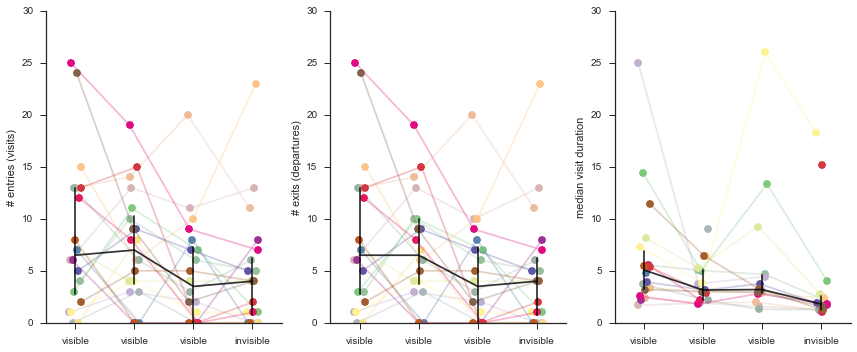

In [83]:
visitRad = 15
numtrials = 4

numEntries = np.zeros((numFlies,numtrials))
numExits = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

visitFig = plt.figure(figsize=(12,5))

numEntryPlt = visitFig.add_subplot(131)
plt.xticks([1,2,3,4],visibilityState, rotation='horizontal')
numExitPlt = visitFig.add_subplot(132)
plt.xticks([1,2,3,4],visibilityState, rotation='horizontal')
meanVisitPlt = visitFig.add_subplot(133)
plt.xticks([1,2,3,4],visibilityState, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        numEntry = sum(entries)
        numExit = sum(exits)
        
        numEntries[fly,trial] = numEntry
        numExits[fly,trial] = numExit
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)

        numEntryPlt.plot(trial+1+tJitter,numEntry,'.',markersize=15,color=flyCMap.to_rgba(fly))
        numExitPlt.plot(trial+1+tJitter,numExit,'.',markersize=15,color=flyCMap.to_rgba(fly))
        meanVisitPlt.plot(trial+1+tJitter,np.nanmedian(visitDuration),'.',markersize=15,color=flyCMap.to_rgba(fly))
        
    numEntryPlt.plot(range(1,numtrials+1)+jitter[fly,:],numEntries[fly,:],
                     '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    numExitPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,numExits[fly,:],'-',
                    markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    meanVisitPlt.plot(range(1,numtrials+1)+jitter[fly,:],lengthVisit[fly,:],'-',
                      markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    

#plot average response
numEntryPlt.plot(range(1,5),np.nanmedian(numEntries,axis=0),color='k',alpha=0.8)
numExitPlt.plot(range(1,5),np.nanmedian(numExits,axis=0),color='k',alpha=0.8)
meanVisitPlt.plot(range(1,5),np.nanmedian(lengthVisit,axis=0),color='k',alpha=0.8)

#plot IQR
for trial in range(numtrials):
    [var1,var2] = np.nanpercentile(numEntries[:,trial],[25,75],axis=0)
    numEntryPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    [var1,var2] = np.nanpercentile(numExits[:,trial],[25,75],axis=0)
    numExitPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    [var1,var2] = np.nanpercentile(lengthVisit[:,trial],[25,75],axis=0)
    meanVisitPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,30)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

numExitPlt.set_ylabel('# exits (departures)')
numExitPlt.set_ylim(0,30)
numExitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numExitPlt)

meanVisitPlt.set_ylabel('median visit duration')
meanVisitPlt.set_ylim(0,30)
meanVisitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(meanVisitPlt)

visitFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'visitAnalysis' + sep)
except OSError:
    print('Analysis directory already exists.')

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotypeSex
                   + '_visitsInRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

Analysis directory already exists.


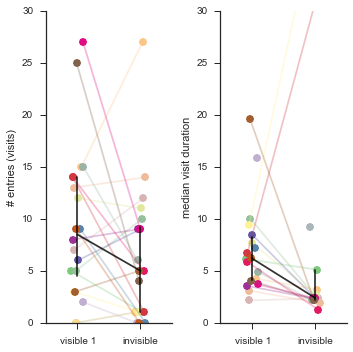

In [87]:
visitRad = 20
trialIds = [1,4]
trialnamesplt = ['visible 1', 'invisible']
numtrials = len(trialIds)


numEntries = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

visitFig = plt.figure(figsize=(5,5))

numEntryPlt = visitFig.add_subplot(121)
plt.xticks([1,2],trialnamesplt, rotation='horizontal')
meanVisitPlt = visitFig.add_subplot(122)
plt.xticks([1,2],trialnamesplt, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(len(trialIds)):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trialIds[trial],FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        numEntry = sum(entries)
        
        numEntries[fly,trial] = numEntry
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)

        numEntryPlt.plot(trial+1+tJitter,numEntry,'.',markersize=15,color=flyCMap.to_rgba(fly))
        meanVisitPlt.plot(trial+1+tJitter,np.nanmedian(visitDuration),'.',markersize=15,color=flyCMap.to_rgba(fly))
        
    numEntryPlt.plot(range(1,numtrials+1)+jitter[fly,:],numEntries[fly,:],
                     '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    meanVisitPlt.plot(range(1,numtrials+1)+jitter[fly,:],lengthVisit[fly,:],'-',
                      markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    

#plot average response
numEntryPlt.plot(range(1,len(trialIds)+1),np.nanmedian(numEntries,axis=0),color='k',alpha=0.8)
meanVisitPlt.plot(range(1,len(trialIds)+1),np.nanmedian(lengthVisit,axis=0),color='k',alpha=0.8)

#plot IQR
for trial in range(len(trialIds)):
    [var1,var2] = np.nanpercentile(numEntries[:,trial],[25,75],axis=0)
    numEntryPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    [var1,var2] = np.nanpercentile(lengthVisit[:,trial],[25,75],axis=0)
    meanVisitPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,30)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

meanVisitPlt.set_ylabel('median visit duration')
meanVisitPlt.set_ylim(0,30)
meanVisitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(meanVisitPlt)

visitFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'visitAnalysis' + sep)
except OSError:
    print('Analysis directory already exists.')

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotypeSex
                   + '_visVsInv_visitsInRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

In [ ]:
visitRad = 20
trialIds = [1,4]
trialnamesplt = ['visible 1', 'invisible']
numtrials = len(trialIds)


numEntries = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

visitFig = plt.figure(figsize=(5,5))

numEntryPlt = visitFig.add_subplot(121)
plt.xticks([1,2],trialnamesplt, rotation='horizontal')
meanVisitPlt = visitFig.add_subplot(122)
plt.xticks([1,2],trialnamesplt, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(len(trialIds)):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trialIds[trial],FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        numEntry = sum(entries)
        
        numEntries[fly,trial] = numEntry
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)

        numEntryPlt.plot(trial+1+tJitter,numEntry,'.',markersize=15,color=flyCMap.to_rgba(fly))
        meanVisitPlt.plot(trial+1+tJitter,np.nanmedian(visitDuration),'.',markersize=15,color=flyCMap.to_rgba(fly))
        
    numEntryPlt.plot(range(1,numtrials+1)+jitter[fly,:],numEntries[fly,:],
                     '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    meanVisitPlt.plot(range(1,numtrials+1)+jitter[fly,:],lengthVisit[fly,:],'-',
                      markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    

#plot average response
numEntryPlt.plot(range(1,len(trialIds)+1),np.nanmedian(numEntries,axis=0),color='k',alpha=0.8)
meanVisitPlt.plot(range(1,len(trialIds)+1),np.nanmedian(lengthVisit,axis=0),color='k',alpha=0.8)

#plot IQR
for trial in range(len(trialIds)):
    [var1,var2] = np.nanpercentile(numEntries[:,trial],[25,75],axis=0)
    numEntryPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    [var1,var2] = np.nanpercentile(lengthVisit[:,trial],[25,75],axis=0)
    meanVisitPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,30)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

meanVisitPlt.set_ylabel('median visit duration')
meanVisitPlt.set_ylim(0,30)
meanVisitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(meanVisitPlt)

visitFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'visitAnalysis' + sep)
except OSError:
    print('Analysis directory already exists.')

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotypeSex
                   + '_visVsInv_visitsInRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

KeyboardInterrupt: 

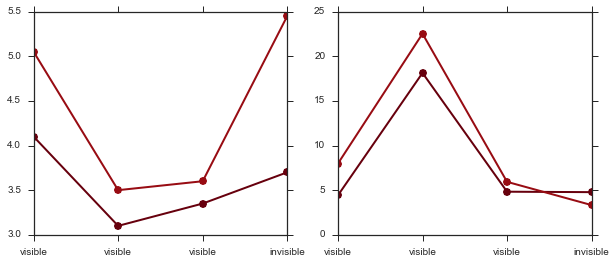

In [55]:
visitRadDists = [10,15,20,30,40]
numtrials = 4

visitFig = plt.figure(figsize=(10,4))
numEntryPlt = visitFig.add_subplot(121)
plt.xticks([1,2,3,4],visibilityState, rotation='horizontal')
visitDurPlt = visitFig.add_subplot(122)
plt.xticks([1,2,3,4],visibilityState, rotation='horizontal')

distanceCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=min(visitRadDists), vmax=60), cmap='Blues_r')
distanceCMap2 = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=min(visitRadDists), vmax=60), cmap='Reds_r')

for dist in range(len(visitRadDists)):
    visitRad = visitRadDists[dist]
    numEntries = np.zeros((numFlies,numtrials))
    lengthVisit = np.zeros((numFlies,numtrials))

    for fly in range(numFlies):
        for trial in range(numtrials):

            entries, exits, visitDuration = countVisits_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
            numEntry = sum(entries)

            numEntries[fly,trial] = numEntry
            lengthVisit[fly,trial] = np.nanmedian(visitDuration)


    numEntryPlt.plot(range(1,5),np.nanmean(numEntries,axis=0),'.',
                     color=distanceCMap2.to_rgba(visitRad),markersize = 15)
    numEntryPlt.plot(range(1,5),np.nanmean(numEntries,axis=0),
                     color=distanceCMap2.to_rgba(visitRad),linewidth = 2)
    
    visitDurPlt.plot(range(1,5),np.nanmean(lengthVisit,axis=0),'.',
                     color=distanceCMap2.to_rgba(visitRad),markersize = 15)
    visitDurPlt.plot(range(1,5),np.nanmean(lengthVisit,axis=0),
                     color=distanceCMap2.to_rgba(visitRad),linewidth = 2)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,15)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

visitDurPlt.set_ylabel('length of visit')
visitDurPlt.set_ylim(0,30)
visitDurPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(visitDurPlt)

visitFig.tight_layout()

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotypeSex
                   + '_entiresPerRad_mean_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

In [95]:
def visitTime_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    
    return entries, exits, time, entryTime, exitTime

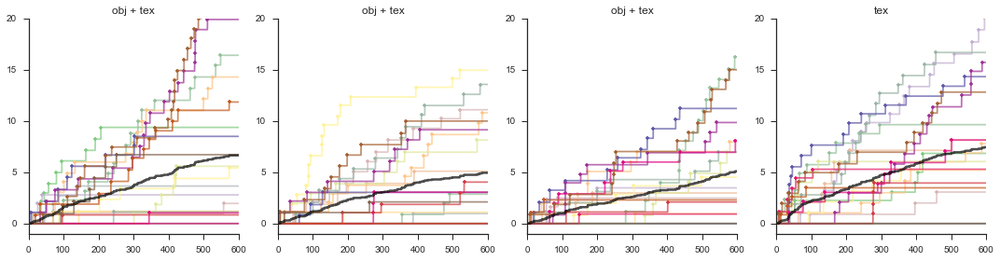

In [96]:
visitRad = 20
numtrials = 4
ymaxval = 20

visitFig = plt.figure(figsize=(15,4))

maxVisit = 0
for trial in range(1,5):
    cumVisitPlt = visitFig.add_subplot(1,4,trial)
    
    allEntries = np.zeros(10*60*20)

    for fly in range(numFlies):
        entries, exits, time, entryTime, exitTime = visitTime_df(visitRad,fly,trial,FOAllFlies_df,keyind_xPos,keyind_yPos)
        entriesCS = np.cumsum(entries + entries*np.random.uniform(-0.2, 0.2,len(entries)))
        cumVisitPlt.plot(time,entriesCS,color=flyCMap.to_rgba(fly),alpha=0.7)
        cumVisitPlt.plot(time[entries>0],entriesCS[entries>0],color=flyCMap.to_rgba(fly),marker='.',linestyle='none')
        maxVisit = max(maxVisit,sum(entries))
        if len(entries) == 10*60*20:
            allEntries = allEntries + entries
            
        
    
    try:
        cumVisitPlt.plot(time,np.cumsum(allEntries/(numFlies*np.ones(len(time)))),color='k',alpha=0.7,linewidth=2.5)
    except:
        print('not enought data')
    cumVisitPlt.set_ylim(-1,min(ymaxval,maxVisit+1))
    cumVisitPlt.set_title(trialName[trial-1])
    myAxisTheme(cumVisitPlt)
    

visitFig.tight_layout()

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotypeSex
                   + '_cumVisitPlt_visitRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Polar coord maps of movement parameter

In [97]:
minDist = 10
maxDist = 60
distEdges = np.linspace(minDist, maxDist, 11)
angleEdges = np.linspace(0, np.pi, 9)
fullAngleEdges = np.linspace(-np.pi, np.pi, 18)
maxVals = (15.0,8.0, 1.2, 0.15) #(20.0,10.0, 1.5, 0.3)#

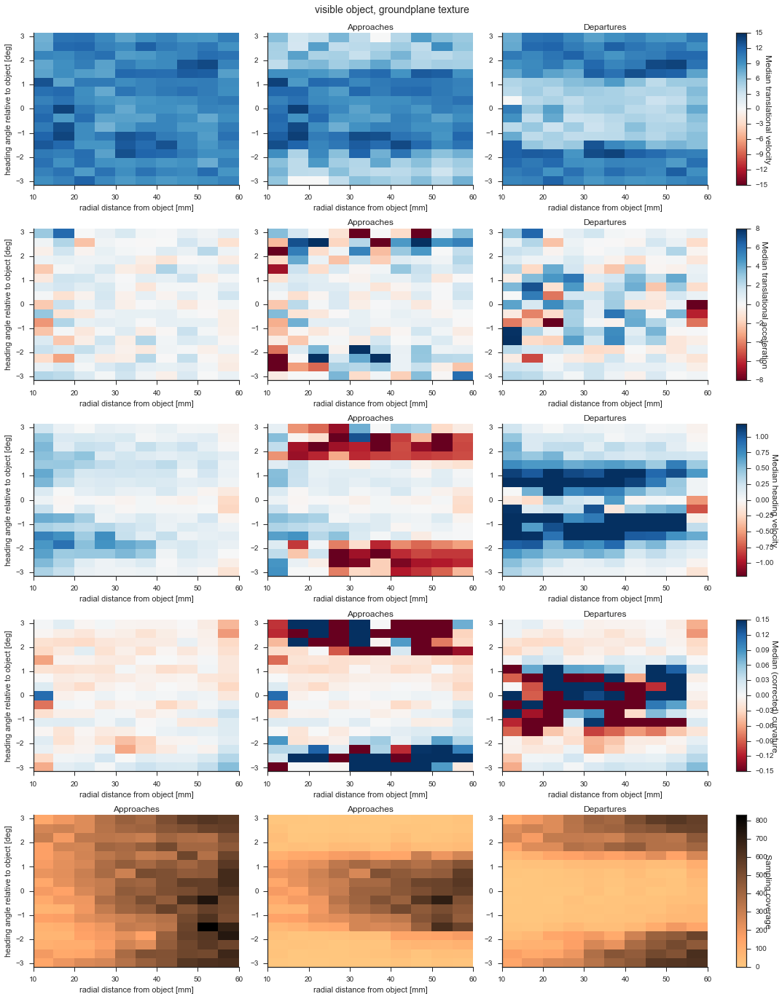

In [98]:
#for tind,trialtype in enumerate(visibilityState):
trial = 1
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                      + '_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

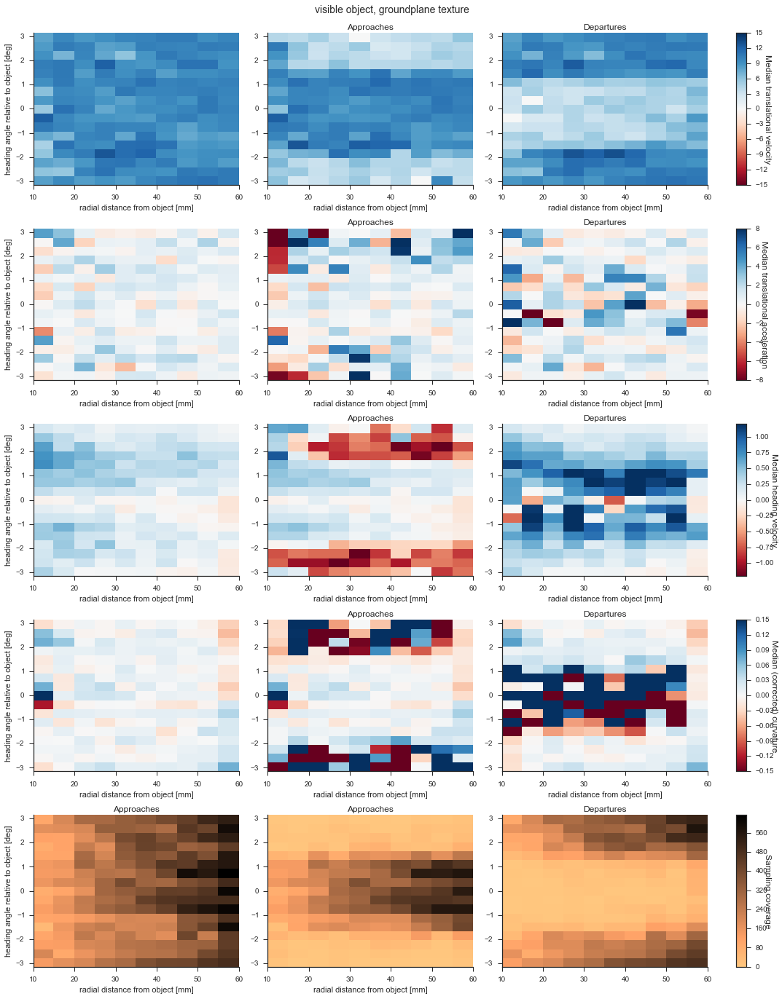

In [99]:
trialtype = 'visible'
trial = 2

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                      + '_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

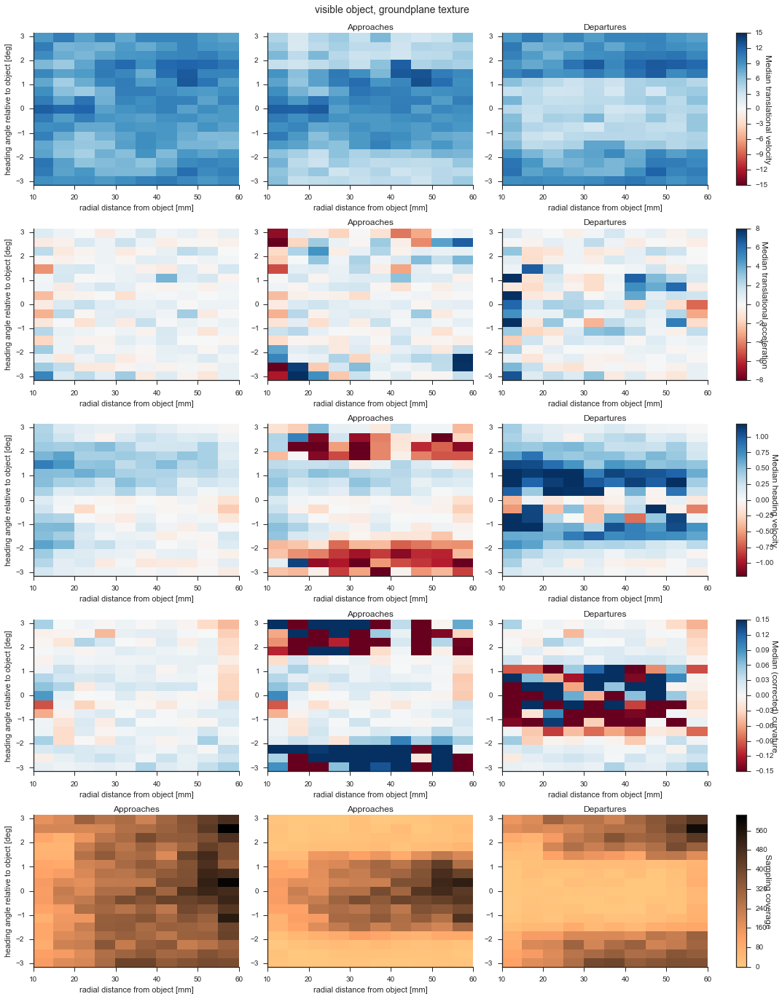

In [100]:
trialtype = 'visible'
trial = 3

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                      + '_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

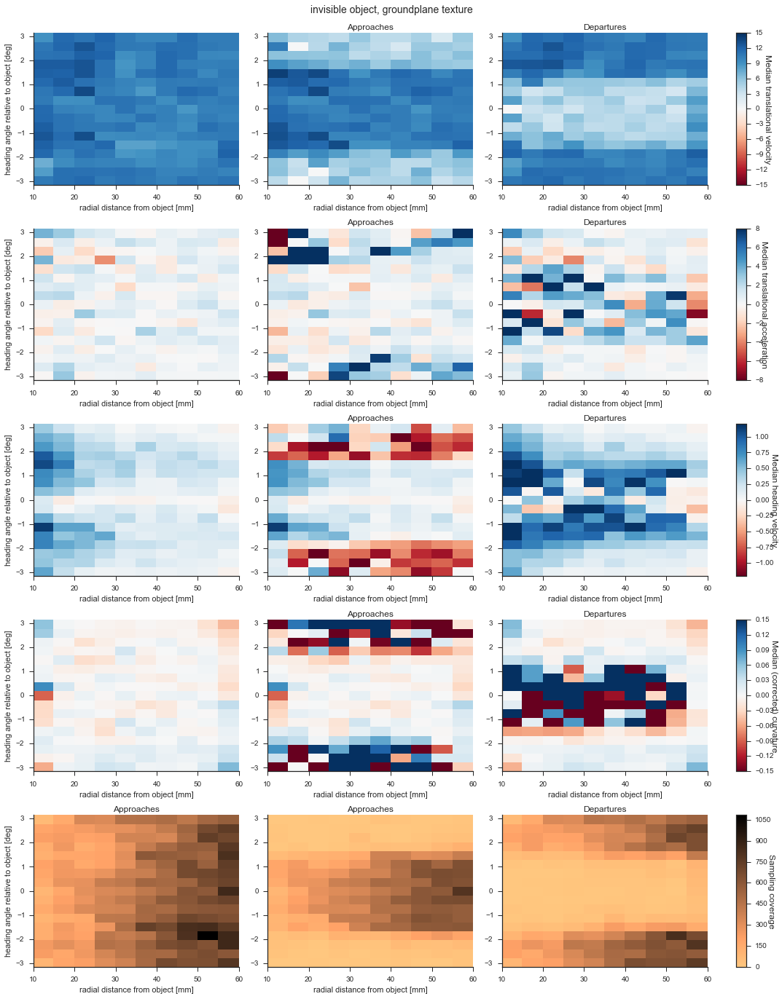

In [101]:
trialtype = 'invisible'
trial = 4

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                      + '_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

In [102]:
def relPolarCoordAverageMap(relPolMeanPlt, distEdges, angleEdges, valuesToMap, objDistance, gamma, colorMap, useMean,
                            maxValue, xlab, ylab):

    # bin valuesToMap by objectDistance value
    digitizedDist = np.digitize(objDistance, distEdges)

    # bin valuesToMap by objectDistance value
    digitizedAngle = np.digitize(gamma, angleEdges)

    meanVals = 1.0*np.zeros((len(angleEdges), len(distEdges)))

    for distBin in range(1, 1+len(distEdges)):
        for angleBin in range(1, 1+len(angleEdges)):
            sltPts = np.logical_and(digitizedDist == distBin, digitizedAngle == angleBin)
            if sum(sltPts) > 0:
                if useMean:
                    meanVals[angleBin-1, distBin-1, ] = np.mean(valuesToMap[sltPts])
                else:
                    # use median
                    meanVals[angleBin-1, distBin-1, ] = np.median(valuesToMap[sltPts])

    pc = relPolMeanPlt.pcolormesh(distEdges, angleEdges, meanVals, cmap=colorMap, vmin=-maxValue, vmax=maxValue)
    relPolMeanPlt.set_xlim(min(distEdges), max(distEdges))
    relPolMeanPlt.set_ylim(min(angleEdges), max(angleEdges))
    relPolMeanPlt.set_xlabel(xlab)
    relPolMeanPlt.set_ylabel(ylab)

    return relPolMeanPlt, meanVals, pc


def movementSplitPolarAverageMaps(relPolMeanPltAll, relPolMeanPltAp, relPolMeanPltDep, cbax, titleString, distEdges,
                                  angleEdges, app, dep, valuesToMap, objDistance, gamma, useMean, maxValue):

    cMap = 'RdBu'
    relPolMeanPltAp.set_title('Total')
    relPolMeanPltAll, meanVals, pc = relPolarCoordAverageMap(relPolMeanPltAll, distEdges, angleEdges,valuesToMap,
                                                             objDistance, gamma, cMap, useMean, maxValue,
                                                             'radial distance from object [mm]',
                                                             'heading angle relative to object [deg]')
    myAxisTheme(relPolMeanPltAll)

    relPolMeanPltAp.set_title('Approaches')
    relPolMeanPltAp, meanVals, pc = relPolarCoordAverageMap(relPolMeanPltAp, distEdges, angleEdges, valuesToMap[app],
                                                            objDistance[app], gamma[app], cMap, useMean, maxValue,
                                                            'radial distance from object [mm]', '')
    myAxisTheme(relPolMeanPltAp)

    relPolMeanPltDep.set_title('Departures')
    relPolMeanPltDep, meanVals, pc = relPolarCoordAverageMap(relPolMeanPltDep, distEdges, angleEdges, valuesToMap[dep],
                                                             objDistance[dep], gamma[dep], cMap, useMean, maxValue,
                                                             'radial distance from object [mm]', '')
    cb = plt.colorbar(pc, cax=cbax)
    cb.ax.set_ylabel(titleString, rotation=270, fontsize=12)
    myAxisTheme(relPolMeanPltDep)

    return relPolMeanPltAp, relPolMeanPltDep


def simpleValuePolCoordPlot(relPolMeanFig, objDistanceall, gammaall, gammaFullall, vT, vR, polarCurv, d_theta, time,
                           distEdges, fullAngleEdges, maxVals):

    d_objDist = np.hstack((0, np.diff(np.convolve(objDistanceall, np.ones((7,))/7, mode='same'))))

    useMean = False

    gs = gridspec.GridSpec(4, 2, width_ratios=[1, 0.05])

    # 1) Translational velocity
    titleString = 'Median translational velocity'
    
    cMap = 'RdBu'
    relPolMeanPltAll, meanVals, pc = relPolarCoordAverageMap(relPolMeanFig.add_subplot(gs[0]), distEdges, 
                                                             fullAngleEdges,vT, objDistanceall, gammaFullall,
                                                             cMap, useMean, maxVals[0],
                                                             'radial distance from object [mm]',
                                                             'heading angle relative to object [deg]')
    
    cb = plt.colorbar(pc, cax=relPolMeanFig.add_subplot(gs[1]))
    cb.ax.set_ylabel(titleString, rotation=270, fontsize=12)
    myAxisTheme(relPolMeanPltAll)
    
    # 2) Rotational velocity
    titleString = 'Median abs. rotational velocity'
    
    cMap = 'RdBu'
    relPolMeanPltAll, meanVals, pc = relPolarCoordAverageMap(relPolMeanFig.add_subplot(gs[2]), distEdges, 
                                                             fullAngleEdges,vR, objDistanceall, gammaFullall,
                                                             cMap, useMean, maxVals[1],
                                                             'radial distance from object [mm]',
                                                             'heading angle relative to object [deg]')
    
    cb = plt.colorbar(pc, cax=relPolMeanFig.add_subplot(gs[3]))
    cb.ax.set_ylabel(titleString, rotation=270, fontsize=12)
    myAxisTheme(relPolMeanPltAll)
    

    # 3) Corrected curvature
    turnSign = np.sign(polarCurv)
    turnSign[d_theta > 0] = np.sign(polarCurv[d_theta > 0])
    turnSign[d_theta < 0] = -np.sign(polarCurv[d_theta < 0])
    polarCurv = np.convolve(polarCurv, np.ones((5,))/5, mode='same')
    polarCurv[abs(polarCurv) > 2] = 2*np.sign(polarCurv[abs(polarCurv) > 2])
    curvmag = abs(np.convolve(polarCurv, np.ones((5,))/5, mode='same'))
    corCurv = turnSign*curvmag

    titleString = 'Median (corrected) curvature'
    
    cMap = 'RdBu'
    relPolMeanPltAll, meanVals, pc = relPolarCoordAverageMap(relPolMeanFig.add_subplot(gs[4]), distEdges, 
                                                             fullAngleEdges,corCurv, objDistanceall, gammaFullall,
                                                             cMap, useMean, maxVals[2],
                                                             'radial distance from object [mm]',
                                                             'heading angle relative to object [deg]')
    
    cb = plt.colorbar(pc, cax=relPolMeanFig.add_subplot(gs[5]))
    cb.ax.set_ylabel(titleString, rotation=270, fontsize=12)
    myAxisTheme(relPolMeanPltAll)
    

    # 4) Coverage map
    titleString = 'Sampling coverage'
    nAll, xedAll, yedAll = np.histogram2d(objDistanceall, gammaFullall, bins=(distEdges, fullAngleEdges))

    allCov = relPolMeanFig.add_subplot(gs[6])
    X, Y = np.meshgrid(yedAll, xedAll)
    pc= allCov.pcolormesh(Y, X, nAll, cmap='copper_r', vmin=0, vmax=np.max(nAll))
    allCov.set_ylim(min(yedAll), max(yedAll))
    allCov.set_xlim(min(xedAll), max(xedAll))
    allCov.set_xlabel('radial distance from object [mm]')
    allCov.set_ylabel('heading angle relative to object [deg]')
    myAxisTheme(allCov)

    cb = plt.colorbar(pc, cax=relPolMeanFig.add_subplot(gs[7]))
    cb.ax.set_ylabel(titleString, rotation=270, fontsize=12)

    return relPolMeanFig


In [103]:
minDist = 5
maxDist = 60
distEdges = np.linspace(minDist, maxDist, 12)
angleEdges = np.linspace(0, np.pi, 9)
fullAngleEdges = np.linspace(-np.pi, np.pi, 18)
maxVals = (15.0,0.4,0.06,0.08) #(15.0,8.0, 0.8, 0.08)

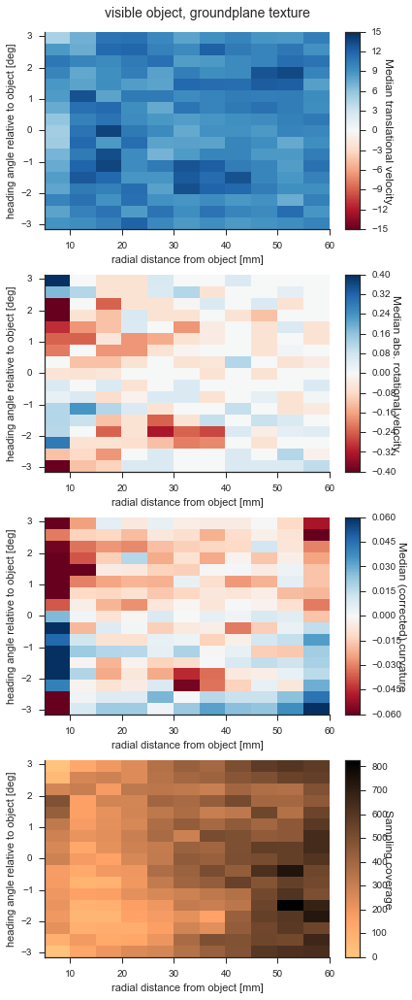

In [104]:
#for tind,trialtype in enumerate(visibilityState):
trial = 1
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vR = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (6,15))
relPolMeanFig = simpleValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,vR,polarCurv,d_theta,
                                       time, distEdges,fullAngleEdges,maxVals)

relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+
                      '_steeringSimple_headingVsDistance2_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

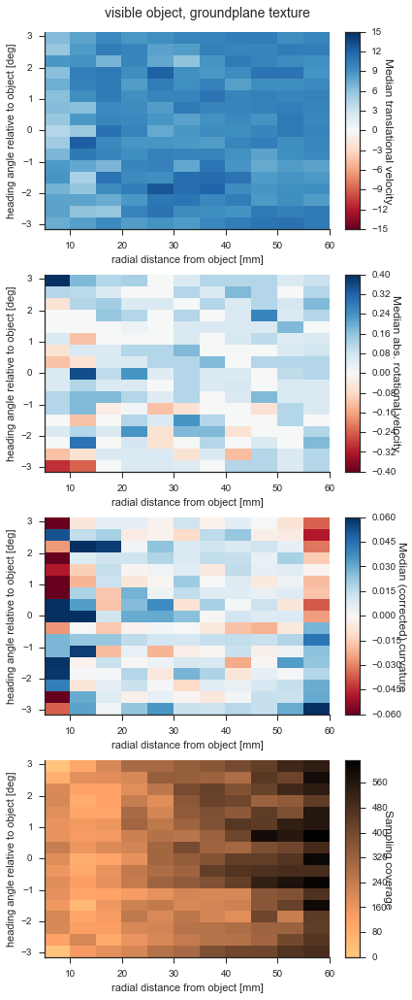

In [105]:
#for tind,trialtype in enumerate(visibilityState):
trial = 2
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vR = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (6,15))
relPolMeanFig = simpleValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,vR,polarCurv,d_theta,
                                       time, distEdges,fullAngleEdges,maxVals)

relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+
                      '_steeringSimple_headingVsDistance2_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

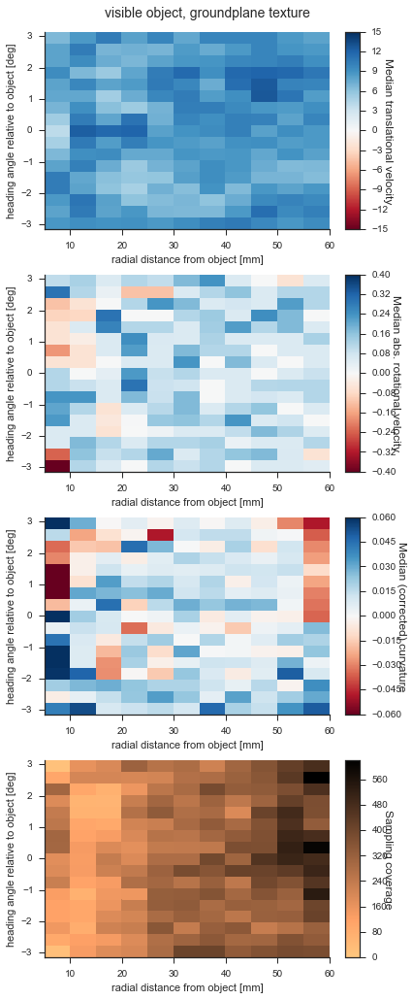

In [106]:
#for tind,trialtype in enumerate(visibilityState):
trial = 3
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vR = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (6,15))
relPolMeanFig = simpleValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,vR,polarCurv,d_theta,
                                       time, distEdges,fullAngleEdges,maxVals)

relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+
                      '_steeringSimple_headingVsDistance2_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

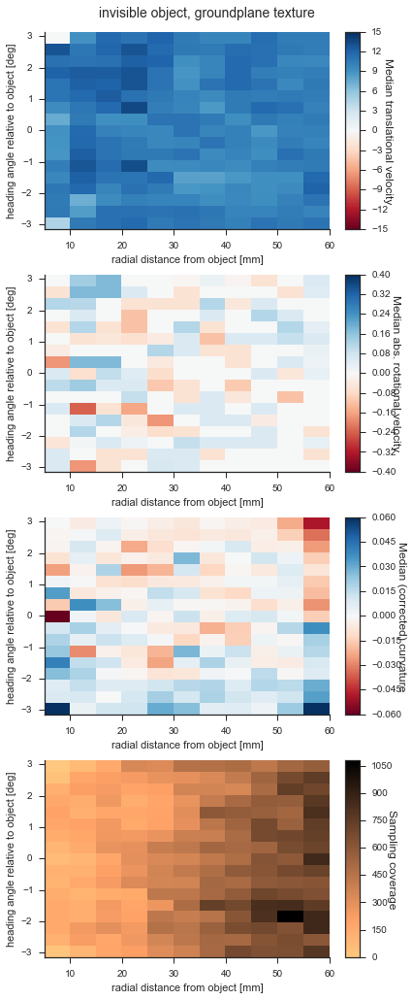

In [107]:
#for tind,trialtype in enumerate(visibilityState):
trial = 4
trialtype = 'invisible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vR = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (6,15))
relPolMeanFig = simpleValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT, vR,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, groundplane ' + groundPlane[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+
                      '_steeringSimple_headingVsDistance2_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

## Comparison between trials

Analysis directory already exists.


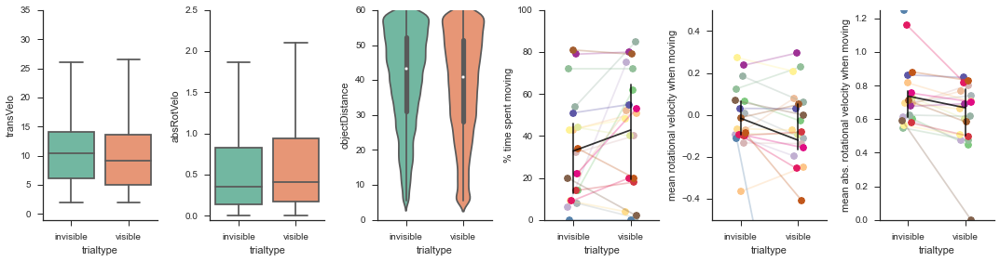

In [108]:
FOAllFliesMoving_df = FOAllFlies_df.query('(moving > 0)')
FOAllFliesMoving_df = FOAllFliesMoving_df[keylistLong]
FOAllFliesMoving_df.insert(0, 'absRotVelo', abs(FOAllFliesMoving_df['rotVelo']))

perTrialBP = plt.figure(figsize=(15,4))

perTrialBPvT = perTrialBP.add_subplot(161)
sns.boxplot(x='trialtype', y='transVelo', 
            data=FOAllFliesMoving_df, palette='Set2',sym='')
perTrialBPvT.set_ylim(-1,35)
myAxisTheme(perTrialBPvT)

perTrialBPvR = perTrialBP.add_subplot(162)
sns.boxplot(x='trialtype', y='absRotVelo',
            data=FOAllFliesMoving_df, palette='Set2',sym='')
perTrialBPvR.set_ylim(-0.05,2.5)
myAxisTheme(perTrialBPvR)

perTrialVPod = perTrialBP.add_subplot(163)
sns.violinplot(x='trialtype', y='objectDistance', data=FOAllFliesMoving_df,
               palette='Set2',sym='', bw=.1)
               #,inner='stick',  scale='count')
perTrialVPod.set_ylim(0,arenaRad)
myAxisTheme(perTrialVPod)

percentMoving = np.zeros((numFlies,2))
rotationBias = np.zeros((numFlies,2))
absRot = np.zeros((numFlies,2))
randJitter = np.zeros((numFlies,2))

perFlyMovingPlt = perTrialBP.add_subplot(164)
plt.xticks([1,2], ["invisible","visible"], rotation='horizontal')
perFlyRotBiasPlt = perTrialBP.add_subplot(165)
plt.xticks([1,2], ["invisible","visible"], rotation='horizontal')
perFlyAbsRotBiasPlt = perTrialBP.add_subplot(166)
plt.xticks([1,2], ["invisible","visible"], rotation='horizontal')

for fly in range(numFlies):
    for ttind,trialtype in enumerate(["visible","invisible"]):
        querystring = '(trialtype == "' + trialtype + '") & (flyID == "' + flyIDs[fly] +  '")'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')        
        jitter = np.random.uniform(-0.1, 0.1)
        percentMoving[fly,ttind] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        rotationBias[fly,ttind] = np.mean(perFlyRot[perFlyMoving])
        absRot[fly,ttind] = np.mean(abs(perFlyRot[perFlyMoving]))
        
        
        randJitter[fly,ttind] = jitter
        perFlyMovingPlt.plot(ttind+1+jitter,percentMoving[fly,ttind],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyRotBiasPlt.plot(ttind+1+jitter,rotationBias[fly,ttind],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        perFlyAbsRotBiasPlt.plot(ttind+1+jitter,absRot[fly,ttind],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))

    perFlyMovingPlt.plot(range(1,3)+randJitter[fly,:] ,percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyRotBiasPlt.plot(range(1,3)+randJitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyAbsRotBiasPlt.plot(range(1,3)+randJitter[fly,:],absRot[fly,:],'-',
                          markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
#plot average response
perFlyMovingPlt.plot(range(1,3),np.mean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,3),np.mean(rotationBias,axis=0),color='k',alpha=0.8)
perFlyAbsRotBiasPlt.plot(range(1,3),np.mean(absRot,axis=0),color='k',alpha=0.8)

for trial in range(len(["visible","invisible"])):
    [var1,var2] = np.nanpercentile(percentMoving[:,trial],[25,75],axis=0)
    perFlyMovingPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(rotationBias[:,trial],[25,75],axis=0)
    perFlyRotBiasPlt.plot((trial+1,trial+1),(var1,var2),'k',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(absRot[:,trial],[25,75],axis=0)
    perFlyAbsRotBiasPlt.plot((trial+1,trial+1),(var1,var2),'k',alpha=0.8)

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,2.5)
perFlyMovingPlt.set_xlabel('trialtype')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(-0.5,0.5)
perFlyRotBiasPlt.set_xlim(0.5,2.5)
perFlyRotBiasPlt.set_xlabel('trialtype')
perFlyRotBiasPlt.set_ylabel('mean rotational velocity when moving')
myAxisTheme(perFlyRotBiasPlt)

perFlyAbsRotBiasPlt.set_ylim(0,1.25)
perFlyAbsRotBiasPlt.set_xlim(0.5,2.5)
perFlyAbsRotBiasPlt.set_xlabel('trialtype')
perFlyAbsRotBiasPlt.set_ylabel('mean abs. rotational velocity when moving')
myAxisTheme(perFlyAbsRotBiasPlt)

perTrialBP.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareTrialtypes' + sep)
except OSError:
    print('Analysis directory already exists.')

perTrialBP.savefig(analysisDir + 'compareTrialtypes/'  + genotypeSex
                   + '_visibleVSinvisible_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

Analysis directory already exists.


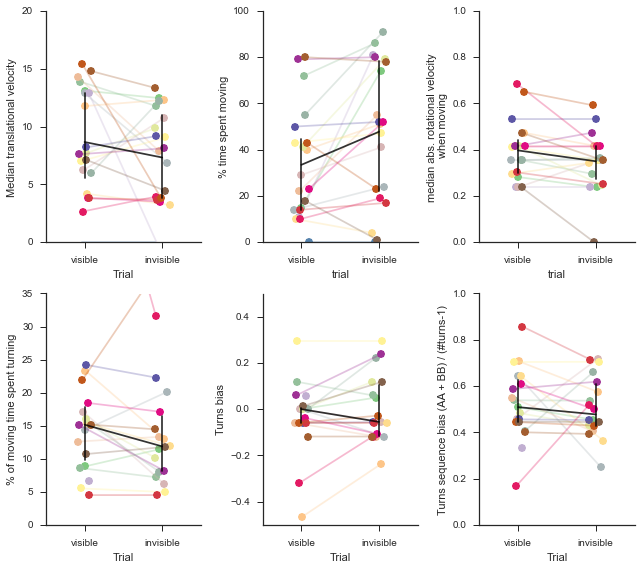

In [109]:
# make fly summary plot of residency:
arenaRad = 60
trialtypes = ["visible","invisible"]
minTurnDist = 5
numtrials = len(trialtypes)
minDist = 10
maxDist = 60

trialComparisonFig = plt.figure(figsize=(9,8))
gs = gridspec.GridSpec(2,3) #,width_ratios=[1,0.9])


# Top row plots: ...............................................................................................

# Plots of (a) percent of time spent moving, (b) rotational bias and (c) mean distance from object
percentMoving = np.zeros((numFlies,numtrials))
rotationBias = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2],trialtypes, rotation='horizontal')

perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2],trialtypes, rotation='horizontal')


for fly in range(numFlies):
    for trial,trialtype in enumerate(trialtypes):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trialtype == "' +trialtype+ '") & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        querystring = '(trialtype == "' +trialtype+ '") & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        rotationBias[fly,trial] = np.nanmedian(abs(perFlyRot))
        
        perFlyMovingPlt.plot(trial+1+tJitter,percentMoving[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))

        perFlyRotBiasPlt.plot(trial+1+tJitter,rotationBias[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
                
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+jitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)

    
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmean(rotationBias,axis=0),color='k',alpha=0.8)

for trial in range(numtrials):
    [var1,var2] = np.nanpercentile(percentMoving[:,trial],[25,75],axis=0)
    perFlyMovingPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(rotationBias[:,trial],[25,75],axis=0)
    perFlyRotBiasPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)


# Beautify axes

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('trial')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(0,1)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('median abs. rotational velocity \n when moving')
myAxisTheme(perFlyRotBiasPlt)

# Bottom row plots: ...............................................................................................

# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

percentMoving = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.nan*np.ones((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnDir = np.nan*np.ones((numFlies,numtrials))
perFlyTurnSeqBias = np.nan*np.ones((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2],trialtypes, rotation='horizontal')
perFlyTurnTHPlt = trialComparisonFig.add_subplot(gs[1,0])
plt.xticks([1,2],trialtypes, rotation='horizontal')
perFlyTurnDirPlt = trialComparisonFig.add_subplot(gs[1,1])
plt.xticks([1,2],trialtypes, rotation='horizontal')
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[1,2])
plt.xticks([1,2],trialtypes, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,trial] = jitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        if not len(perFlyTra) > 0:
            continue
            
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        #perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyTurnDir[fly,trial] = np.nanmedian(perFlyRot)
        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
        
        alphaVal = min(perFlyNumTurn[fly,trial]/3,1)
        
        percentMoving[fly,trial] = np.nanmedian(perFlyTra)
        
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnTHPlt.plot(trial+1+jitter,perFlyTurnTH[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyTurnDirPlt.plot(trial+1+jitter,perFlyTurnDir[fly,trial],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqBiasPlt.plot(trial+1+jitter,perFlyTurnSeqBias[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)    
    perFlyTurnTHPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnTH[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnDirPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnDir[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTurnTHPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnTH,axis=0),color='k',alpha=0.8)
perFlyTurnDirPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnDir,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

for trial in range(numtrials):
    [var1,var2] = np.nanpercentile(percentMoving[:,trial],[25,75],axis=0)
    perFlyMovingPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(perFlyTurnTH[:,trial],[25,75],axis=0)
    perFlyTurnTHPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(perFlyTurnDir[:,trial],[25,75],axis=0)
    perFlyTurnDirPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

    [var1,var2] = np.nanpercentile(perFlyTurnSeqBias[:,trial],[25,75],axis=0)
    perFlyTurnSeqBiasPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

# Beautify axes
perFlyMovingPlt.set_ylim(0,20)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Median translational velocity')
myAxisTheme(perFlyMovingPlt)

perFlyTurnTHPlt.set_ylim(0,35)
perFlyTurnTHPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnTHPlt.set_xlabel('Trial')
perFlyTurnTHPlt.set_ylabel('% of moving time spent turning')
myAxisTheme(perFlyTurnTHPlt)

perFlyTurnDirPlt.set_ylim(-0.5,0.5)
perFlyTurnDirPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnDirPlt.set_xlabel('Trial')
perFlyTurnDirPlt.set_ylabel('Turns bias')
myAxisTheme(perFlyTurnDirPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareTrialtypes' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareTrialtypes/'+genotype+'_'+flyIDs[0][0]
                   +'_trialtype_n'+str(len(flyIDs))+'.pdf', format='pdf')

Analysis directory already exists.


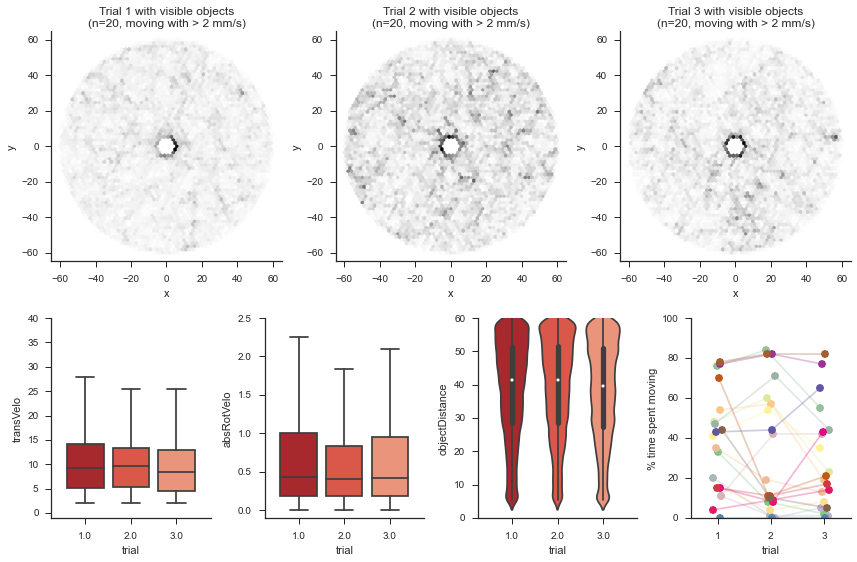

In [110]:
# make fly summary plot of residency:
arenaRad = 60
numBins = 60

trialComparisonFig = plt.figure(figsize=(12,8))
gs = gridspec.GridSpec(2,12,height_ratios=[1,0.8])
numVItrials = 3
for trial in range(1,numVItrials+1):
    querystring = '(trial == ' + str(trial) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    movingall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1]).squeeze().astype('bool')

    # make plot
    sbplt = trialComparisonFig.add_subplot(gs[0,(trial-1)*4:trial*4]) #(1,numVItrials,trial)
    
    noNans = ~np.isnan(xPosMAall)
    titlestring = 'Trial '+str(trial)+' with visible objects\n(n='+str(nTrialsVI/numVItrials)+', moving with > '+str(vTransTH)+' mm/s)'

    hexplotfig_trial = plotResidencyInMiniarena(sbplt, xPosMAall[noNans][movingall[noNans]],
                                                yPosMAall[noNans][movingall[noNans]],numBins, arenaRad,
                                                'Greys',titlestring)

FOAllFliesVisible_df = FOAllFlies_df.query('(trialtype == "visible") & (trial < 4) & (moving > 0)')
FOAllFliesVisible_df = FOAllFliesVisible_df[keylistLong]

FOAllFliesVisible_df.insert(keylistLong.index('rotVelo'), 'absRotVelo', abs(FOAllFliesVisible_df['rotVelo']))

#perTrialBP = plt.figure(figsize=(13,4))
perTrialBPvT = trialComparisonFig.add_subplot(gs[1,0:3])
sns.boxplot(x='trial', y='transVelo', 
            data=FOAllFliesVisible_df, palette='Reds_r',sym='')
perTrialBPvT.set_ylim(-1,40)
perTrialBPvT.set_xlim(-0.75,2.75)
myAxisTheme(perTrialBPvT)

perTrialBPvR = trialComparisonFig.add_subplot(gs[1,3:6])
sns.boxplot(x='trial', y='absRotVelo',
            data=FOAllFliesVisible_df, palette='Reds_r',sym='')
perTrialBPvR.set_ylim(-0.1,2.5)
perTrialBPvR.set_xlim(-0.75,2.75)
myAxisTheme(perTrialBPvR)

perTrialVPod = trialComparisonFig.add_subplot(gs[1,6:9])
sns.violinplot(x='trial', y='objectDistance',data=FOAllFliesVisible_df,
               palette='Reds_r',sym='', bw=.1)
perTrialVPod.set_ylim(0,arenaRad)
perTrialVPod.set_xlim(-0.75,2.75)
myAxisTheme(perTrialVPod)

percentMoving = np.zeros((numFlies,3))
randJitter = np.zeros((numFlies,3))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[1,9:12])

for fly in range(numFlies):
    for trial in range(3):
        querystring = '(trialtype == "visible") & (trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'
        #perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int')        
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('int')
        jitter = np.random.uniform(-0.1, 0.1)
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        randJitter[fly,trial] = jitter
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))

    perFlyMovingPlt.plot(range(1,4)+randJitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)

perFlyMovingPlt.set_xlabel('trial')
plt.xticks([1,2,3],[1,2,3], rotation='horizontal')
perFlyMovingPlt.set_ylabel('% time spent moving')
perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,3.5)
myAxisTheme(perFlyMovingPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareVisibleTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir + 'compareVisibleTrials/'  + genotypeSex
                   + '_visibleTrials'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

In [111]:
trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareAllTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareAllTrials/'+genotype+'_'+flyIDs[0][0]
                   +'_allTrials'+'_n'+str(len(flyIDs))+'.pdf', format='pdf')

Analysis directory already exists.


Analysis directory already exists.


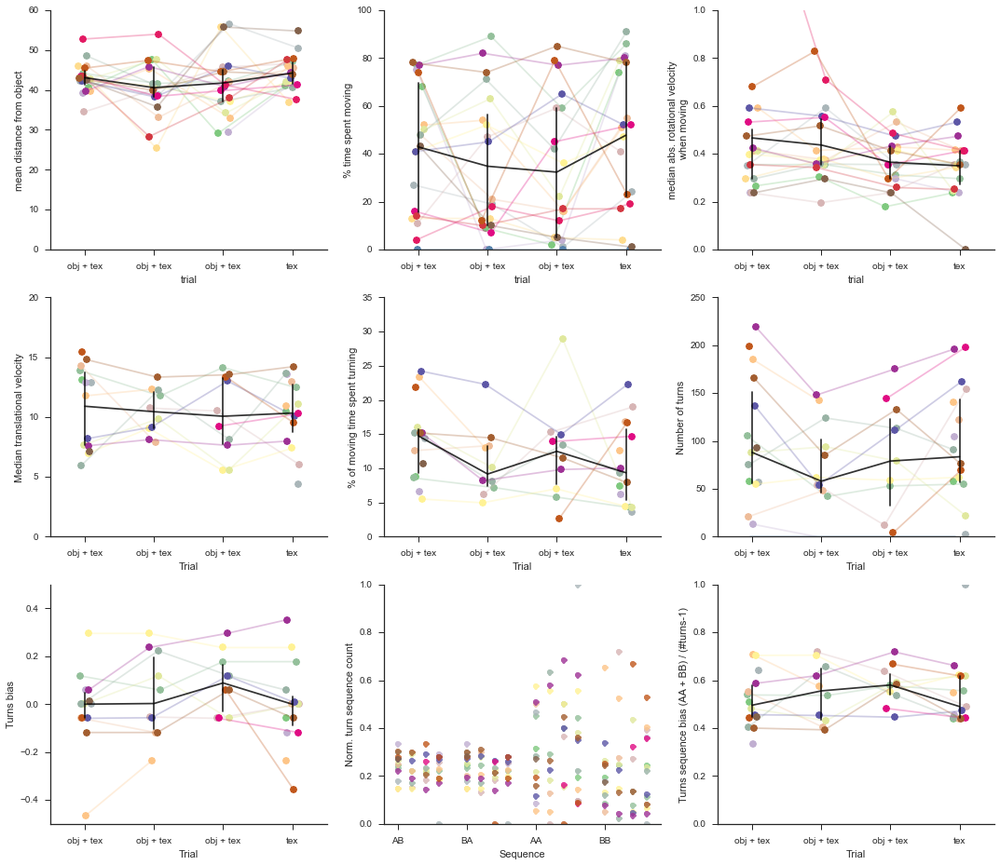

In [113]:
# make fly summary plot of residency:
arenaRad = 60
numtrials = len(visibilityState)
numINtrials = sum(['invisible' in visibilityState[trial] for trial in range(len(visibilityState))])
numVItrials = len(visibilityState)-numINtrials

minTurnDist = 5

minDist = 10
maxDist = 60

trialComparisonFig = plt.figure(figsize=(15,13))
gs = gridspec.GridSpec(3,3) #,width_ratios=[1,0.9])

nTrial = [nTrialsVI/3, nTrialsVI/3,nTrialsVI/3, nTrialsIN]

# Top row plots: ...............................................................................................

# Plots of (a) percent of time spent moving, (b) rotational bias and (c) mean distance from object
percentMoving = np.zeros((numFlies,numtrials))
rotationBias = np.nan*np.ones((numFlies,numtrials))
meanObjDist = np.nan*np.ones((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

perFlyMeanDistPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')


for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        perFlyObjDist = FOAllFlies_df.query(querystring).iloc[:,keyind_objD:keyind_objD+1].squeeze().astype('float')
        
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        rotationBias[fly,trial] = np.nanmedian(abs(perFlyRot))
        meanObjDist[fly,trial] = np.nanmedian(perFlyObjDist)
        
        perFlyMovingPlt.plot(trial+1+tJitter,percentMoving[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))

        perFlyRotBiasPlt.plot(trial+1+tJitter,rotationBias[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        perFlyMeanDistPlt.plot(trial+1+tJitter,meanObjDist[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+jitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
        
    perFlyMeanDistPlt.plot(range(1,numtrials+1)+jitter[fly,:],meanObjDist[fly,:],'-',
                         markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmean(rotationBias,axis=0),color='k',alpha=0.8)
perFlyMeanDistPlt.plot(range(1,numtrials+1),np.nanmean(meanObjDist,axis=0),color='k',alpha=0.8)

for trial in range(numtrials):
    [var1,var2] = np.nanpercentile(percentMoving[:,trial],[25,75],axis=0)
    perFlyMovingPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(rotationBias[:,trial],[25,75],axis=0)
    perFlyRotBiasPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(meanObjDist[:,trial],[25,75],axis=0)
    perFlyMeanDistPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)


# Beautify axes
perFlyMeanDistPlt.set_ylim(0,arenaRad)
perFlyMeanDistPlt.set_xlim(0.5,numtrials+0.5)
perFlyMeanDistPlt.set_xlabel('trial')
perFlyMeanDistPlt.set_ylabel('mean distance from object')
myAxisTheme(perFlyMeanDistPlt)

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('trial')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(0,1)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('median abs. rotational velocity \n when moving')
myAxisTheme(perFlyRotBiasPlt)

# Bottom row plots: ...............................................................................................

# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

percentMoving = np.nan*np.ones((numFlies,numtrials))
perFlyTurnTH = np.nan*np.ones((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnDir = np.nan*np.ones((numFlies,numtrials))
perFlyTurnSeqBias = np.nan*np.ones((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[1,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnTHPlt = trialComparisonFig.add_subplot(gs[1,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyNumTurnPlt = trialComparisonFig.add_subplot(gs[1,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyTurnDirPlt = trialComparisonFig.add_subplot(gs[2,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnSeqPlt = trialComparisonFig.add_subplot(gs[2,1])
plt.xticks([0,1,2,3],['AB','BA','AA','BB'])
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[2,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,trial] = jitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        if perFlyMoving.size < 5:
            continue
            
        if (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 20:
            percentMoving[fly,trial] = np.nan
            perFlyTurnTH[fly,trial] = np.nan
            perFlyNumTurn[fly,trial] = np.nan
            perFlyTurnDir[fly,trial] = np.nan
            perFlyTurnSeqBias[fly,trial] = np.nan
            continue

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyTurnDir[fly,trial] = np.nanmedian(perFlyRot)
        #abs((1.0*sum(perFlyRot_filt>turnTH_pos) - sum(perFlyRot_filt<turnTH_neg))/
        #                               max(1.0*sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg),1))
        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
        
        alphaVal = min(perFlyNumTurn[fly,trial]/3,1)
        
        percentMoving[fly,trial] = np.nanmedian(perFlyTra)
        
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnTHPlt.plot(trial+1+jitter,perFlyTurnTH[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyNumTurnPlt.plot(trial+1+jitter,perFlyNumTurn[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyTurnDirPlt.plot(trial+1+jitter,perFlyTurnDir[fly,trial],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqPlt.plot(range(numBin)+np.ones(numBin)*0.2*trial,n/(np.ones(numBin)*sum(n)),
                              marker = 'o',linestyle='none',alpha = 0.8,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqBiasPlt.plot(trial+1+jitter,perFlyTurnSeqBias[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)    
    perFlyTurnTHPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnTH[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyNumTurnPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyNumTurn[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnDirPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnDir[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTurnTHPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnTH,axis=0),color='k',alpha=0.8)
perFlyNumTurnPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyNumTurn,axis=0),color='k',alpha=0.8)
perFlyTurnDirPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnDir,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

for trial in range(numtrials):
    [var1,var2] = np.nanpercentile(percentMoving[:,trial],[25,75],axis=0)
    perFlyMovingPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(perFlyTurnTH[:,trial],[25,75],axis=0)
    perFlyTurnTHPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(perFlyNumTurn[:,trial],[25,75],axis=0)
    perFlyNumTurnPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)
    
    [var1,var2] = np.nanpercentile(perFlyTurnDir[:,trial],[25,75],axis=0)
    perFlyTurnDirPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)

    [var1,var2] = np.nanpercentile(perFlyTurnSeqBias[:,trial],[25,75],axis=0)
    perFlyTurnSeqBiasPlt.plot((trial+1,trial+1),(var1,var2),'k-',alpha=0.8)


# Beautify axes
perFlyMovingPlt.set_ylim(0,20)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Median translational velocity')
myAxisTheme(perFlyMovingPlt)

perFlyTurnTHPlt.set_ylim(0,35)
perFlyTurnTHPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnTHPlt.set_xlabel('Trial')
perFlyTurnTHPlt.set_ylabel('% of moving time spent turning')
myAxisTheme(perFlyTurnTHPlt)

perFlyNumTurnPlt.set_xlim(0.5,numtrials+0.5)
perFlyNumTurnPlt.set_xlabel('Trial')
perFlyNumTurnPlt.set_ylabel('Number of turns')
myAxisTheme(perFlyNumTurnPlt)

perFlyTurnDirPlt.set_ylim(-0.5,0.5)
perFlyTurnDirPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnDirPlt.set_xlabel('Trial')
perFlyTurnDirPlt.set_ylabel('Turns bias')
myAxisTheme(perFlyTurnDirPlt)

perFlyTurnSeqPlt.set_ylim(0,1)
perFlyTurnSeqPlt.set_xlim(-0.2,numBin-0.2)
perFlyTurnSeqPlt.set_xlabel('Sequence')
perFlyTurnSeqPlt.set_ylabel('Norm. turn sequence count')
myAxisTheme(perFlyTurnSeqPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareAllTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareAllTrials/'+genotype+'_'+flyIDs[0][0]
                   +'_allTrials_allFlies'+'_n'+str(len(flyIDs))+'.pdf', format='pdf')